# Imports

## Libraries

In [2]:
import torch

print(torch.cuda.is_available())
print(torch.cuda.device_count())
print(torch.cuda.get_device_name(0))

True
2
NVIDIA GeForce RTX 3090


In [105]:
from orbit_generation.constants import EM_MU
from orbit_generation.data import TSFeatureWiseScaler,discard_random_labels, remove_duplicates_preserve_order
from orbit_generation.processing import reorder_orbits
from orbit_generation.visualize import create_image_grid_from_routes, plot_single_image, visualize_static_orbits, visualize_orbits_comparison
from orbit_generation.dataset import get_first_period_dataset, get_orbit_classes
from orbit_generation.model_factory import get_model
from orbit_generation.propagation import jacobi_constant
from orbit_generation.stats import calculate_per_orbit_spatial_statistics
from orbit_generation.experiment import get_experiment_data
from orbit_generation.evaluation import calculate_distance, orbits_distances, find_nearest_orbits, find_nearest_orbits_batch, evaluate_clustering_multiple_labels
from orbit_generation.latent_space import plot_2d_latent_space, plot_combined_2d_latent_space, plot_linear_regression, compute_centroids

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import os
import pickle
import joblib
from sklearn.preprocessing import StandardScaler


In [5]:
import pandas as pd

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

## Params

In [6]:
# Experiment 116 parameters (try 86)
params=  {
            "data_used": "EM_N_fix_1500",
            "families_to_discard": 30,
            "seq_len": 100,
            "feature_dim": 7,
            "epochs": 50,
            "val_split": 0.05,
            "batch_size": 32,
            "lr": 0.001,
            "model_name": "vae_conv5_legit",
            "latent_dim": 2,
            "max_iter_convergence": 20,
            "input_seq_len_convergence": 1,
            "samples_to_generate": 100,
            "distance_metric": "euclidean",
            "model_kwargs": {
                "dropout_rate": 0.2,
                "beta": 1
            }
}

In [7]:
# 116
# 85
experiment_id = 116

In [8]:
data_path = r"/orbit-generation/data/orbits_fix_1500/EM_N_fix_1500.h5"
experiments_folder = "/orbit-generation/experiments"
experiment_folder = os.path.join(experiments_folder, f"experiment_{experiment_id}")
images_folder = os.path.join(experiment_folder, 'images')

In [9]:
# Images
## Orbits
static_all_orbit_path = os.path.join(images_folder, f'exp{experiment_id}_generated_orbits.png')
dynamic_orbits_path = os.path.join(images_folder, f'exp{experiment_id}_generated_orbits.html')
refined_orbits_path = os.path.join(images_folder, f'exp{experiment_id}_refined_orbits.png')
dynamical_refined_orbits_path = os.path.join(images_folder, f'exp{experiment_id}_refined_orbits.html')
generated_orbits_that_converged_path = os.path.join(images_folder, f'exp{experiment_id}_generated_orbits_that_converged.png')
generated_orbits_that_did_not_converged_path = os.path.join(images_folder, f'exp{experiment_id}_generated_orbits_that_not_converged.png')
## Latent Spaces
latent_space_path = os.path.join(images_folder, f'exp{experiment_id}_latent_space')
full_latent_space_path = os.path.join(images_folder, f'exp{experiment_id}_full_latent_space')
discarded_latent_space_path = os.path.join(images_folder, f'exp{experiment_id}_discarded_latent_space')
combined_latent_space_path = os.path.join(images_folder, f'exp{experiment_id}_combined_latent_space')
combined_latent_space_arrows_path = os.path.join(images_folder, f'exp{experiment_id}_combined_latent_space_arrows')
family_centroids_plot_path = os.path.join(images_folder, f'exp{experiment_id}_family_centroids')
full_family_centroids_plot_path = os.path.join(images_folder, f'exp{experiment_id}_full_family_centroids')
## Feature Spaces
features_plot_path = os.path.join(images_folder, f'exp{experiment_id}_features')
family_feature_centroids_plot_path = os.path.join(images_folder, f'exp{experiment_id}_family_feature_centroids')
## Other
model_losses_path = os.path.join(images_folder, f'exp{experiment_id}_model_losses.png')
histogram_comparison_path = os.path.join(images_folder, f'exp{experiment_id}_histogram_comparison.png')
full_histogram_comparison_path = os.path.join(images_folder, f'exp{experiment_id}_full_histogram_comparison.png')

# Model
model_save_path = os.path.join(experiment_folder, f'exp{experiment_id}_model.pth')

# Orbits
generated_data_path = os.path.join(experiment_folder, f'exp{experiment_id}_generated_orbits.npy')
refined_data_path = os.path.join(experiment_folder, f'exp{experiment_id}_refined_orbits.npy')

# Latent Representations
latent_representations_path = os.path.join(experiment_folder, f'exp{experiment_id}_latent_representations.npy')
family_centroids_path = os.path.join(experiment_folder, f'exp{experiment_id}_family_centroids.npy')

# Features
generation_df_path = os.path.join(experiment_folder, f'exp{experiment_id}_generation_df.csv')
refined_orbits_df_path = os.path.join(experiment_folder, f'exp{experiment_id}_refined_orbits_df.csv')


## Data

In [10]:
full_data, full_orbit_df, full_labels, system_dict = get_first_period_dataset(file_path=data_path, segment_length=params['seq_len'])
full_data.shape

(45211, 7, 100)

Remove specific families from the training data

In [11]:
full_orbits_id_classes = [full_orbit_df.at[index, 'id_class'] for index in full_labels]

experiment_data = get_experiment_data(experiments_folder=experiments_folder, experiment_id=experiment_id)
discarded_family_ids = experiment_data.get('discarded_family_ids', {})  
discarded_family_ids, data, orbits_id_classes = discard_random_labels(full_data, np.array(full_orbits_id_classes), discarded_family_ids)
discarded_families = get_orbit_classes(discarded_family_ids)[0]
orbit_df = full_orbit_df[~full_orbit_df['id_class'].isin(discarded_family_ids)]

discarded_families

['S_L4_SP',
 'S_L1_V',
 'S_L1_HS',
 'S_R34',
 'S_L1_L',
 'S_L4_V',
 'S_R23',
 'S_L2_HN',
 'S_R43',
 'S_R32',
 'S_L1_A',
 'S_R21',
 'S_LPOE',
 'S_R13',
 'S_DPO',
 'S_R14',
 'S_L3_HS',
 'S_DS',
 'S_L2_L',
 'S_DRO',
 'S_L5_A',
 'S_L3_HN',
 'S_BS',
 'S_L3_L',
 'S_L5_V',
 'S_R41',
 'S_L4_A',
 'S_L2_HS',
 'S_LPOW',
 'S_BN']

Get Features

In [12]:
family_labels = get_orbit_classes(orbits_id_classes)[0]

feature_names=['jacobi', 'period', 'stability']
features=orbit_df[feature_names].to_numpy()

Scale

In [13]:
scaler = TSFeatureWiseScaler()        
scaled_data = scaler.fit_transform(torch.tensor(data, dtype=torch.float32))
scaled_data.shape

torch.Size([11367, 7, 100])

## Model

In [14]:
model = get_model(params)
model.load_state_dict(torch.load(model_save_path, weights_only=True))

<All keys matched successfully>

# Dataset Latent Space

## Calculations

In [15]:
latent_means, latent_log_vars = model.encode(scaled_data)

latent_means = latent_means.detach().numpy()
latent_log_vars = latent_log_vars.detach().numpy()
latent_representation = np.concatenate((latent_means, latent_log_vars), axis=1)
latent_representation.shape

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:370: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at ../aten/src/ATen/native/Convolution.cpp:1036.)
  return F.conv1d(


(11367, 4)

In [16]:
latent_log_vars = torch.from_numpy(latent_log_vars)
latent_stdevs = torch.exp(0.5 * latent_log_vars)
latent_stdevs = latent_stdevs.numpy()
latent_stdevs.shape

(11367, 2)

In [17]:
features.shape

(11367, 3)

In [18]:
# Scale full data
full_scaled_data = scaler.transform(torch.tensor(full_data, dtype=torch.float32))

# Encode full data
full_latent_means, full_latent_log_vars= model.encode(full_scaled_data)

full_latent_means = full_latent_means.detach().numpy()

# Calculate stdevs
full_latent_stdevs = torch.exp(0.5 * full_latent_log_vars)
full_latent_stdevs = full_latent_stdevs.detach().numpy()
full_latent_stdevs.shape

(45211, 2)

In [19]:
full_family_labels=get_orbit_classes(full_orbits_id_classes)[0]
family_labels_discarded_train = [label if label in discarded_families else 'training' for label in full_family_labels]
family_labels_discarded_train = np.array(family_labels_discarded_train)
family_labels_discarded_train.shape

(45211,)

In [20]:
full_features=full_orbit_df[feature_names].to_numpy()
full_features.shape

(45211, 3)

In [21]:
# Compute centroids
centroid_means = compute_centroids(latent_means, orbits_id_classes, method='mean')
centroid_log_vars = compute_centroids(latent_log_vars, orbits_id_classes, method='mean')
centroids_representation = np.concatenate((centroid_means, centroid_log_vars), axis=1)
np.save(family_centroids_path, centroids_representation)
centroid_log_vars = torch.from_numpy(centroid_log_vars)
centroid_stdevs = torch.exp(0.5 * centroid_log_vars)
centroid_stdevs = centroid_stdevs.numpy()
centroid_stdevs.shape

(10, 2)

In [22]:
# Compute centroid labels
unique_classes = remove_duplicates_preserve_order(orbits_id_classes)
family_names=get_orbit_classes(unique_classes)[0]
len(family_names)

10

In [23]:
# Compute full data centroid
full_data_centroid = np.mean(latent_means, axis=0)
full_data_centroid

array([-0.02923074,  0.00053974], dtype=float32)

In [24]:
# Compute centroids
full_centroid_means = compute_centroids(full_latent_means, full_orbits_id_classes, method='mean')
full_centroid_log_vars = compute_centroids(full_latent_log_vars.detach().numpy(), full_orbits_id_classes, method='mean')
full_centroid_stdevs = compute_centroids(full_latent_stdevs, full_orbits_id_classes, method='mean')
full_centroid_stdevs.shape

(40, 2)

In [25]:
# Calculate full centroid labels
full_unique_classes = remove_duplicates_preserve_order(full_orbits_id_classes)
full_family_names=get_orbit_classes(full_unique_classes)[0]
len(full_family_names)

40

In [26]:
families_discarded_train = [label if label in discarded_families else 'training' for label in full_family_names]
families_discarded_train = np.array(families_discarded_train)
discarded_orbit_indices = [i for i in range(len(family_labels_discarded_train)) if family_labels_discarded_train[i] != 'training']
len(families_discarded_train)

40

## Training Dataset

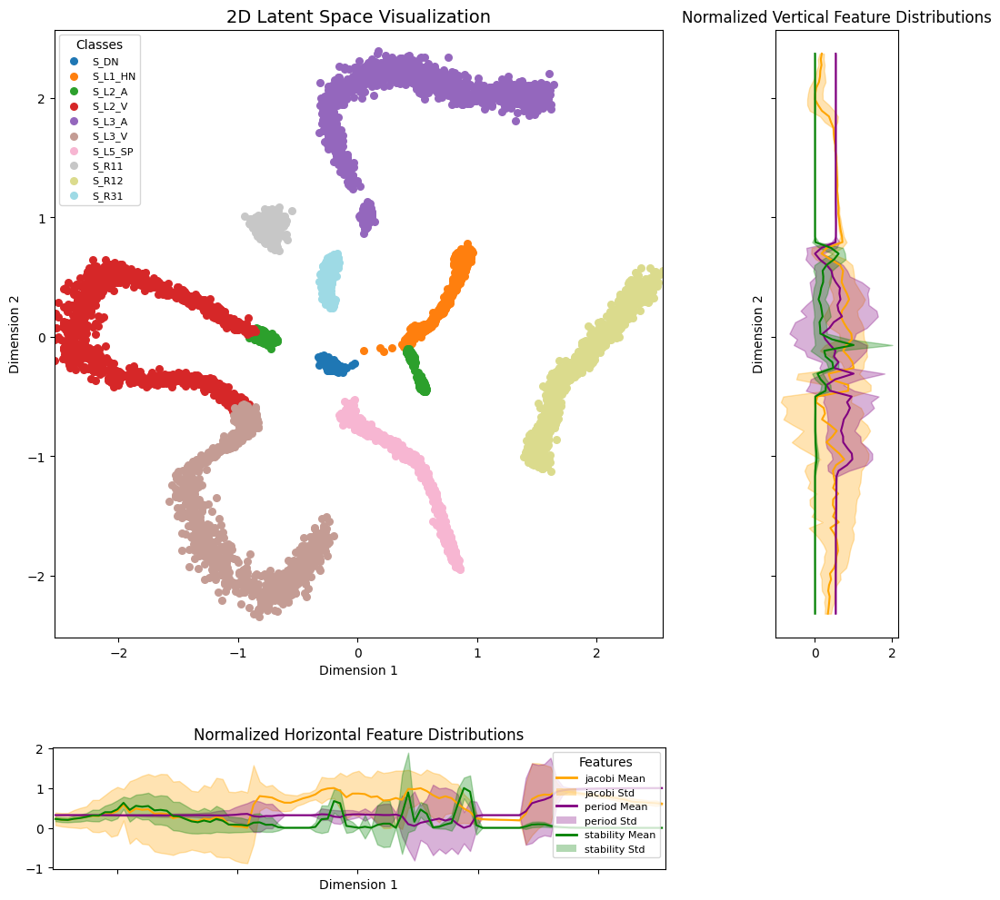

In [27]:
plot_2d_latent_space(latent_means, np.array(family_labels), features=features,
                        feature_names=feature_names,plot_std=True)

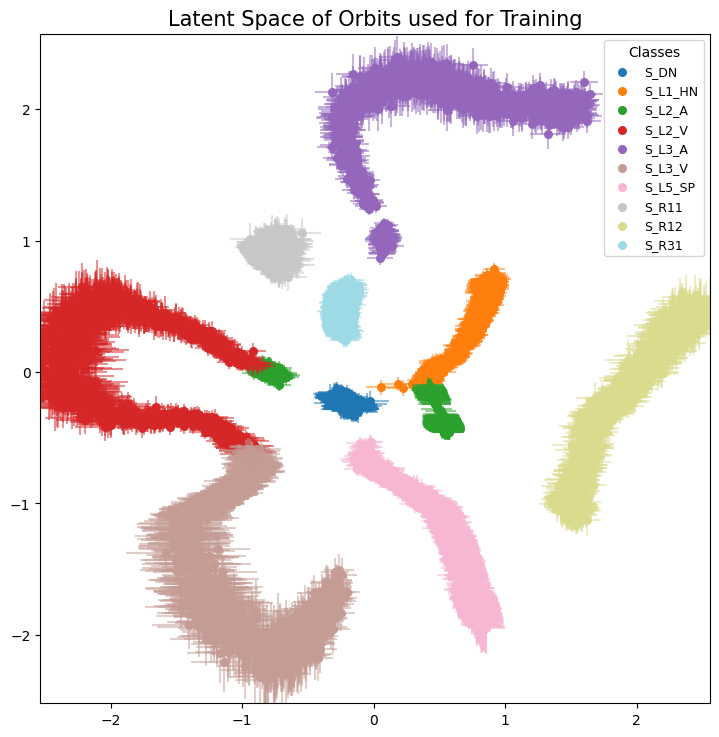

In [28]:
plot_2d_latent_space(latent_means, np.array(family_labels), latent_stdevs=latent_stdevs,
                     axis_labels=('', ''), title="Latent Space of Orbits used for Training",
                     legend_fontsize=9,title_size=15)

## Full Dataset

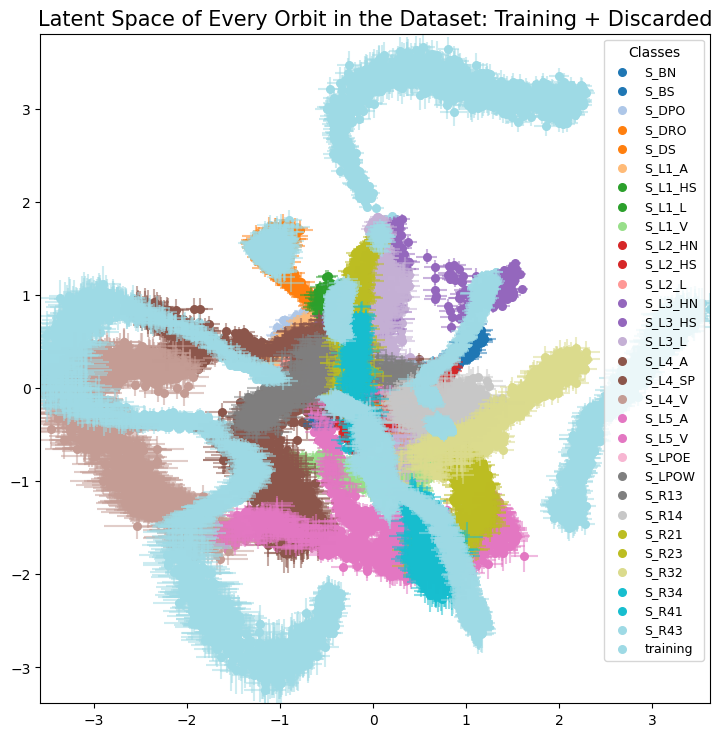

In [29]:
plot_2d_latent_space(full_latent_means, family_labels_discarded_train, latent_stdevs=full_latent_stdevs,
                     axis_labels=('', ''), title="Latent Space of Every Orbit in the Dataset: Training + Discarded",
                     legend_fontsize=9, title_size=15)

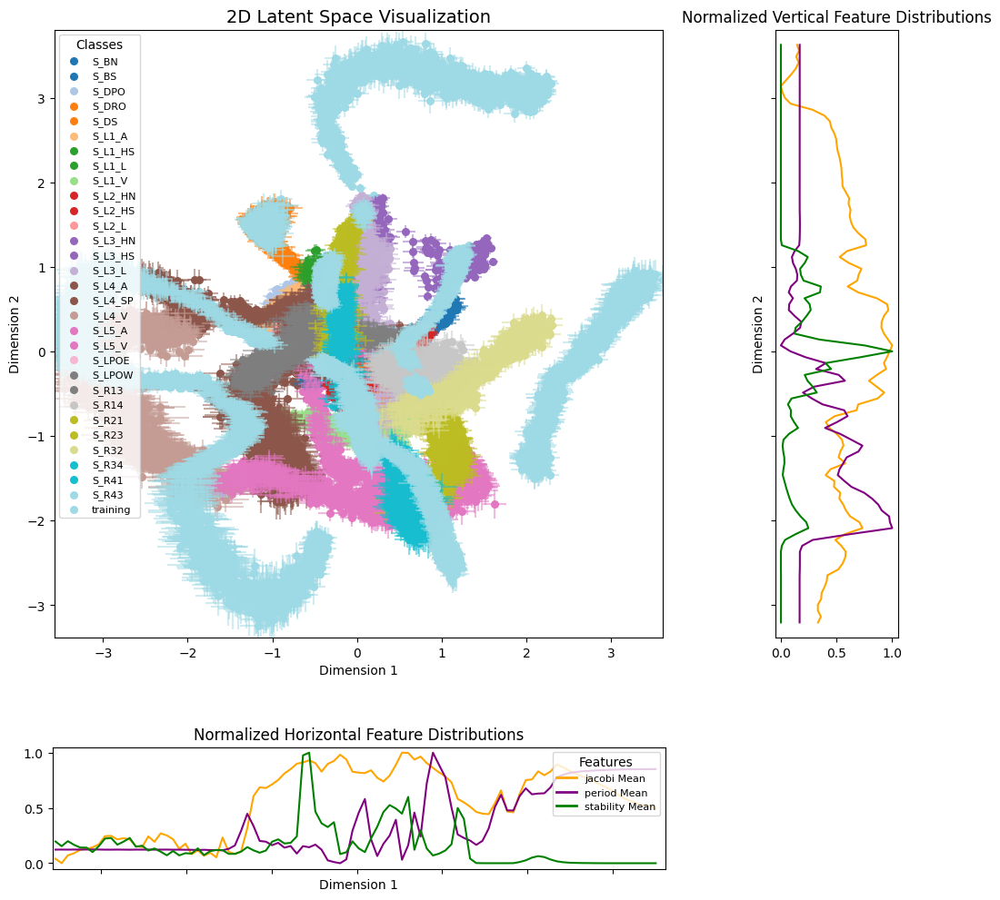

In [30]:
plot_2d_latent_space(full_latent_means, family_labels_discarded_train, features=full_features,
                     feature_names=feature_names, plot_std=False, latent_stdevs=full_latent_stdevs)

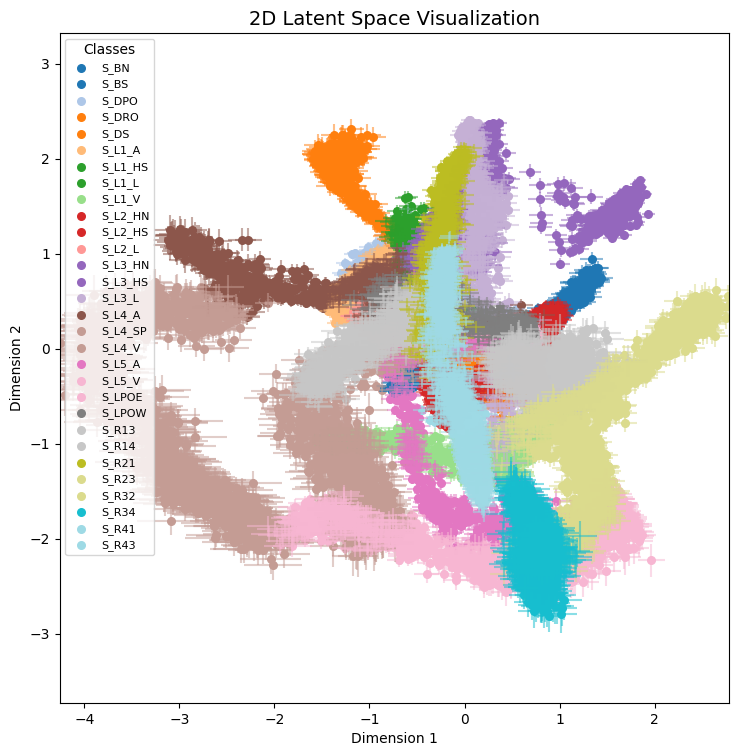

In [31]:
plot_2d_latent_space(full_latent_means[discarded_orbit_indices],
                        family_labels_discarded_train[discarded_orbit_indices],
                        save_path=discarded_latent_space_path,
                        features=full_features[discarded_orbit_indices],
                        latent_stdevs=full_latent_stdevs[discarded_orbit_indices])

## Clustering Metrics

In [106]:
cluster_metrics = evaluate_clustering_multiple_labels(full_latent_means, [full_family_labels], label_names=['family'], clustering_method='gmm')
print(cluster_metrics)

{'family_ari': 0.32398264144310956, 'family_nmi': np.float64(0.655451595439812), 'family_homogeneity': np.float64(0.6331732471606544), 'family_completeness': np.float64(0.6793548543311099), 'family_v-measure': np.float64(0.655451595439812), 'family_fmi': np.float64(0.3534765384075556), 'family_purity': np.float64(0.4779589038065957), 'family_silhouette_score': np.float32(0.4110627), 'family_jaccard': np.float64(0.0014329261651970337), 'family_accuracy': np.float64(0.4178850279799164)}


## Training Centroids

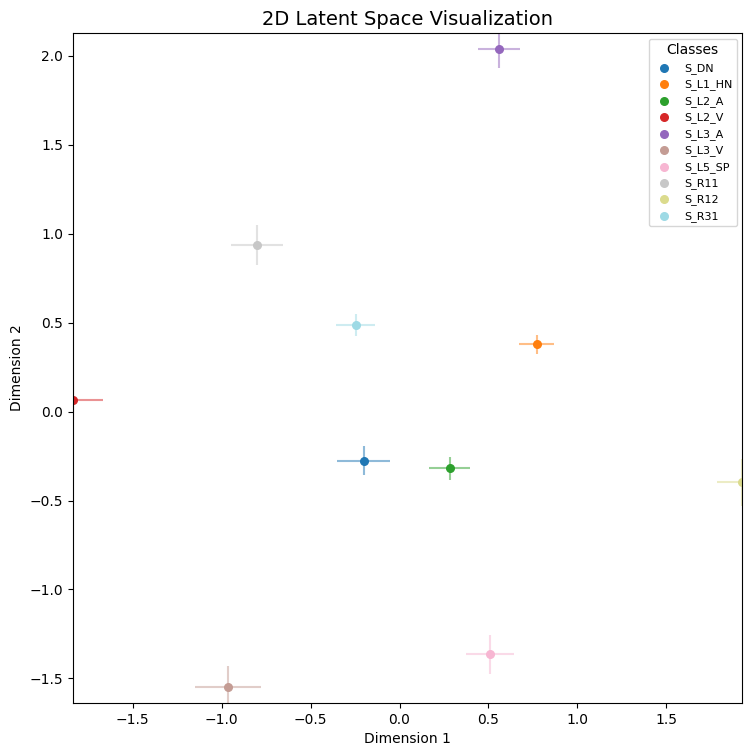

In [32]:
plot_2d_latent_space(centroid_means, np.array(family_names), latent_stdevs=centroid_stdevs)

## Full Centroids

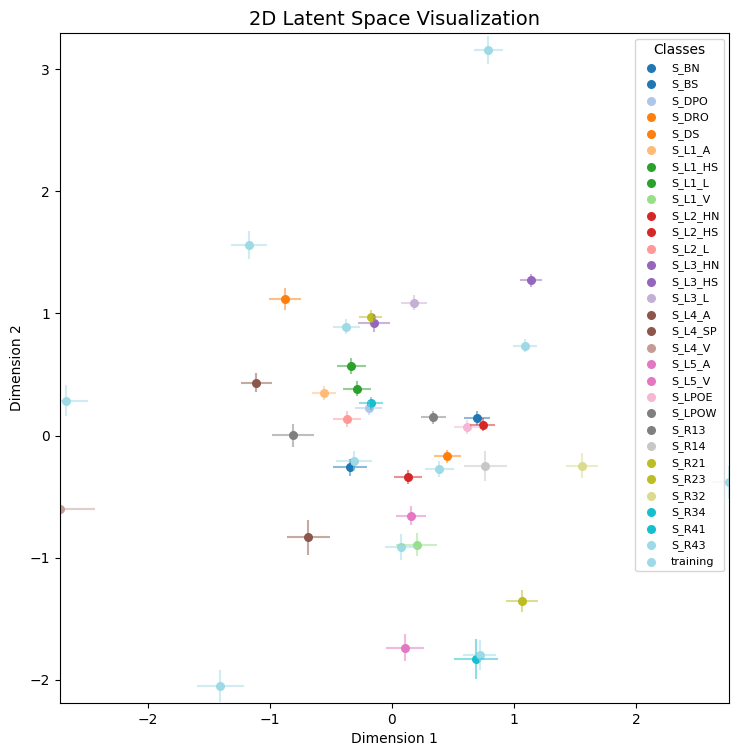

In [33]:
plot_2d_latent_space(full_centroid_means, families_discarded_train, latent_stdevs=full_centroid_stdevs)

# Generation

## Imports

In [34]:
generation = np.load(generated_data_path)
generation.shape

(300, 7, 100)

In [35]:
generation_df = pd.read_csv(generation_df_path)
generation_df.head()

,position_error,velocity_error,energy_error,disorder_metric,correct_order,inversions,kendall_tau_distance,nearest_orbit,nearest_orbit_distance
0,0.167550,0.356176,2.055638,82.0,86.0,47.0,0.018990,20235,3.617536
1,0.041144,0.105237,0.053455,98.0,83.0,59.0,0.023838,2888,2.008097
2,0.073238,0.217751,0.209356,408.0,65.0,258.0,0.104242,9331,1.969582
3,0.435789,0.365965,0.631862,320.0,76.0,215.0,0.086869,35789,11.514208
4,0.090326,0.687021,5.928947,54.0,84.0,32.0,0.012929,40587,2.921422


In [36]:
refined_orbits = np.load(refined_data_path)
reordered_refined_orbits, _, _ = reorder_orbits(refined_orbits)
refined_orbits.shape

(140, 7, 100)

In [37]:
refined_orbits_df = pd.read_csv(refined_orbits_df_path)
refined_orbits_df.head()

,id,old_period,period,iterations_convergence,error,initial_pos_x0,initial_pos_y0,initial_pos_z0,initial_vel_x0,initial_vel_y0,initial_vel_z0,final_pos_x0,final_pos_y0,final_pos_z0,final_vel_x0,final_vel_y0,final_vel_z0,disorder_metric,correct_order,inversions,kendall_tau_distance,propagated_position_error,propagated_velocity_error,propagated_energy_error,latent_distance_to_generation,calculated_jacobi,period_distance_with_generation,feature_closest_orbit,feature_distance_from_closest_orbit,nearest_orbit,nearest_orbit_distance,distance_from_generation,centroid_distance,feature_centroid_distance,closest_family_centroid,closest_family_centroid_distance,closest_family_feature_centroid,closest_family_feature_centroid_distance,initial_conditions_distance,closest_family_full_centroid,closest_family_full_centroid_distance,family_of_feature_closest_orbit,family_of_closest_orbit
0,0,5.970095,6.261689,14,2.177359e-11,-1.672384,0.197360,-0.004944,-0.131479,2.013470,0.002885,-1.890881,-0.075624,3.156304e-03,-0.078437,1.672169,-6.984244e-02,94.0,80.0,57.0,0.023030,1.519432e-12,5.385060e-12,9.521093e-13,0.042681,1.845175,0.291594,20211,0.000121,20217,3.169317,3.986457,1.201150,1.138238,9,0.733003,18,0.184543,0.496906,19,0.501979,17.0,17.0
1,1,5.762555,6.747913,13,1.172315e-12,1.146281,0.012663,0.119440,0.007081,-0.226648,0.241234,1.016803,0.004804,2.605369e-01,-0.032308,-0.023131,1.086547e-01,236.0,71.0,158.0,0.063838,2.061160e-12,5.886800e-12,8.540419e-14,0.022202,2.986561,0.985357,1496,0.011063,2777,3.292461,3.143534,0.395551,0.771247,0,0.178532,35,0.404108,0.311901,2,0.178617,2.0,3.0
2,6,6.125951,6.156255,7,2.363295e-12,1.043744,-0.064992,0.037998,-0.078029,-0.525581,0.715356,1.081223,-0.016988,2.534353e-02,-0.064532,-0.580450,8.675794e-01,28.0,87.0,14.0,0.005657,1.385793e-12,4.312269e-12,1.557156e-12,0.064102,2.141212,0.030304,18913,0.000408,18915,0.858896,1.733873,1.764993,1.128089,3,0.399080,29,0.160346,0.173879,15,0.394888,16.0,16.0
3,7,4.687366,4.729179,11,1.505815e-12,1.097317,0.007104,-0.004319,-0.041922,-0.228566,-0.155920,1.225314,-0.240151,3.673249e-15,-0.252196,-0.510227,8.882345e-15,486.0,66.0,323.0,0.130505,1.739751e-12,3.280340e-12,5.691519e-14,0.164957,2.886419,0.041812,28511,0.003577,13907,4.619803,4.623523,0.586623,2.569823,2,0.210171,11,0.383418,0.474759,32,0.057855,26.0,12.0
4,9,6.172528,6.571012,8,2.488562e-13,0.469477,-0.878074,-0.014306,-0.280210,-0.131603,0.019204,0.485121,-1.017461,-4.596324e-14,-0.231256,-0.097450,-7.265335e-13,82.0,82.0,55.0,0.022222,3.035552e-12,5.311197e-12,4.447172e-14,0.014222,2.985590,0.398484,29883,0.000099,29886,0.509034,1.615098,0.878932,0.896547,2,0.616545,35,0.238286,0.154304,39,0.092489,28.0,28.0


In [38]:
index_100 = refined_orbits_df[refined_orbits_df['id'] >= 100].index[0] if not refined_orbits_df[refined_orbits_df['id'] >= 100].empty else None
index_200 = refined_orbits_df[refined_orbits_df['id'] >= 200].index[0] if not refined_orbits_df[refined_orbits_df['id'] >= 200].empty else None

In [39]:
orbits_paths = [
    f'{experiment_folder}/images/exp{experiment_id}_generated_orbits_sample1.png',
    f'{experiment_folder}/images/exp{experiment_id}_refined_orbits_sample1.png',
    f'{experiment_folder}/images/exp{experiment_id}_generated_orbits_sample2.png',
    f'{experiment_folder}/images/exp{experiment_id}_refined_orbits_sample2.png',
    f'{experiment_folder}/images/exp{experiment_id}_generated_orbits_sample3.png',
    f'{experiment_folder}/images/exp{experiment_id}_refined_orbits_sample3.png',
]

## Visualization

### Random Sampling

In [40]:
sample1_generation = generation[:100]
sample1_generation.shape

(100, 7, 100)

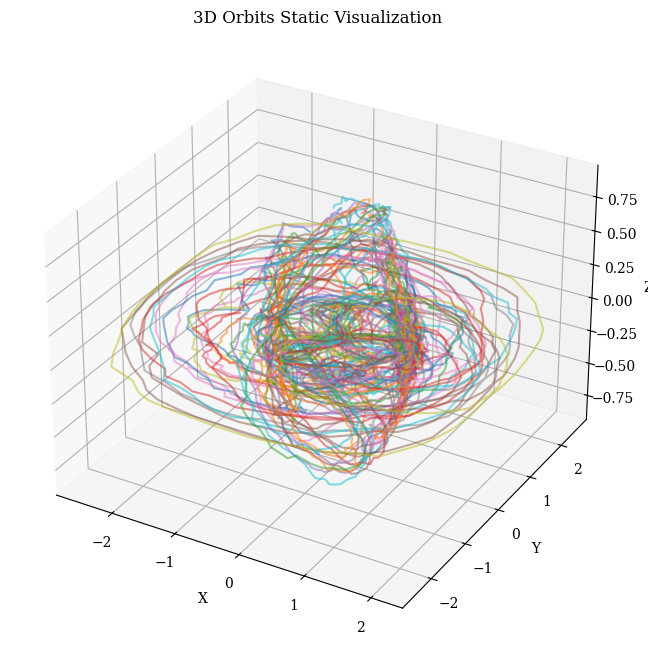

In [41]:
visualize_static_orbits(sample1_generation[:,1:,:], show_legend=False, save_path=orbits_paths[0])

In [42]:
sample1_orbits = reordered_refined_orbits[:index_100,1:,:]
sample1_orbits.shape

(49, 6, 100)

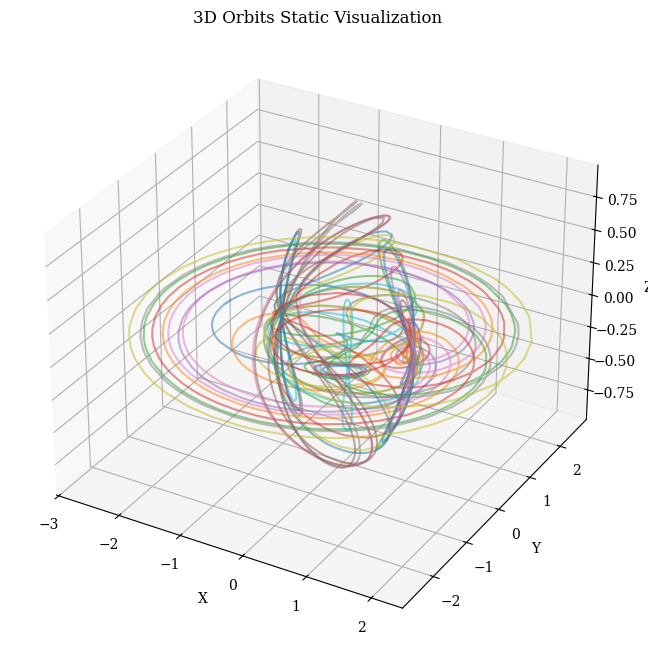

In [43]:
visualize_static_orbits(sample1_orbits, show_legend=False, save_path=orbits_paths[1])

### Grid Sampling

In [44]:
sample2_generation = generation[100:200]
sample2_generation.shape

(100, 7, 100)

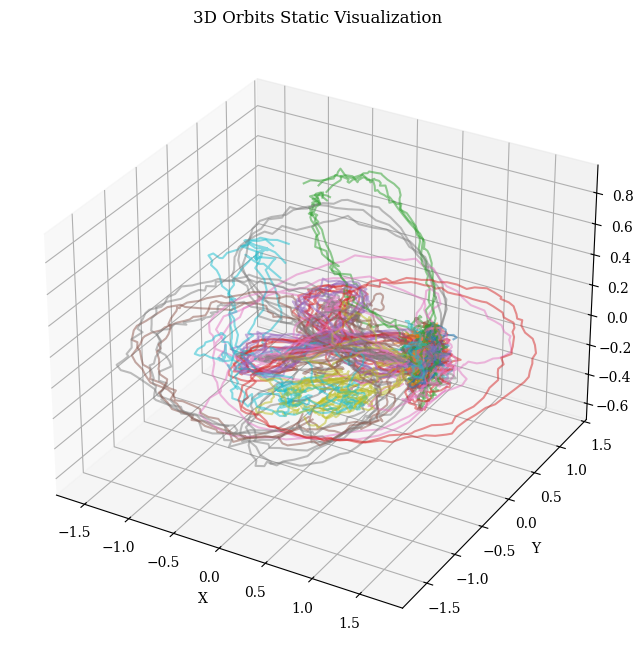

In [45]:
visualize_static_orbits(sample2_generation[:,1:,:], show_legend=False, save_path=orbits_paths[2])

In [46]:
sample2_orbits = reordered_refined_orbits[index_100:index_200,1:,:]
sample2_orbits.shape

(33, 6, 100)

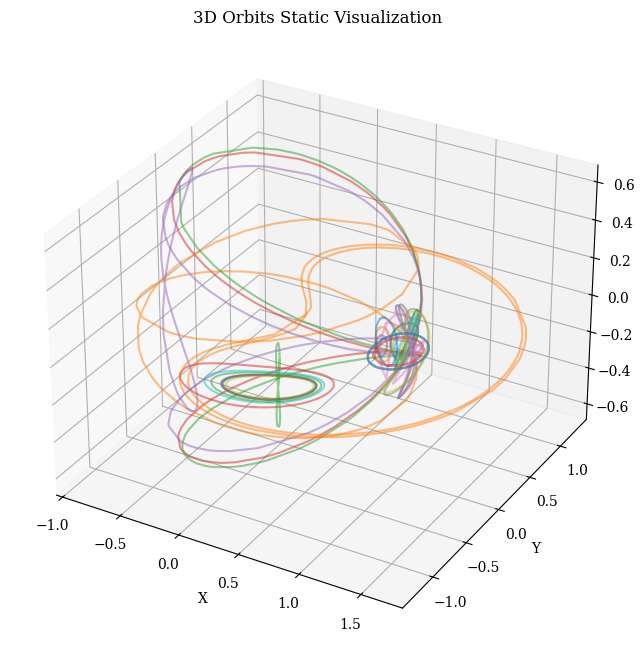

In [47]:
visualize_static_orbits(sample2_orbits, show_legend=False, save_path=orbits_paths[3])

### Centroid Sampling

In [48]:
sample3_generation = generation[200:]
sample3_generation.shape

(100, 7, 100)

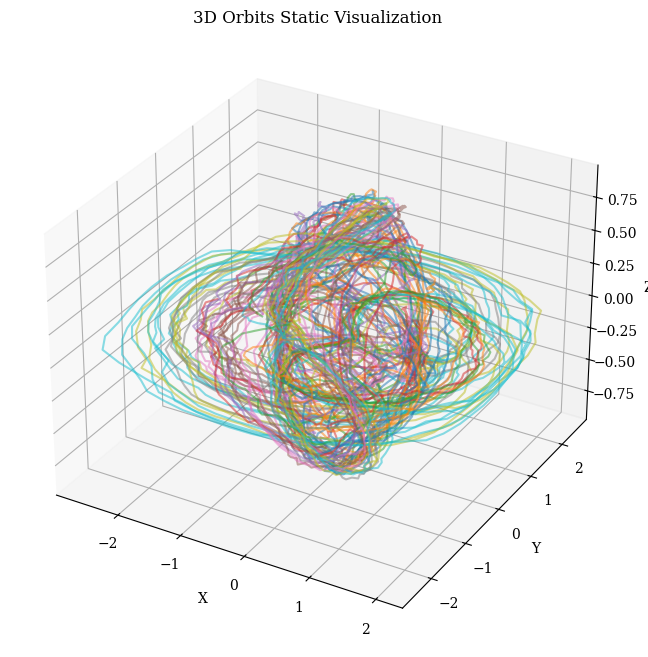

In [49]:
visualize_static_orbits(sample3_generation[:,1:,:], show_legend=False, save_path=orbits_paths[4])

In [50]:
sample3_orbits = reordered_refined_orbits[index_200:,1:,:]
sample3_orbits.shape

(58, 6, 100)

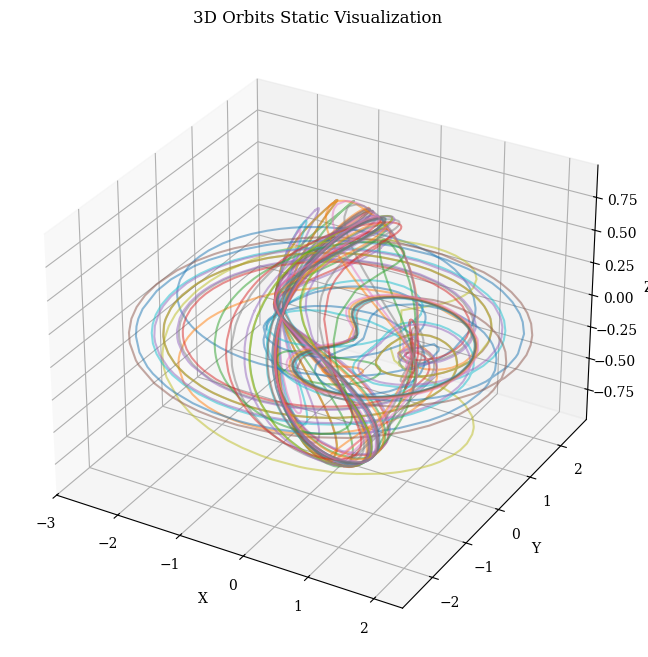

In [51]:
visualize_static_orbits(sample3_orbits, show_legend=False, save_path=orbits_paths[5])

### All Orbits

In [52]:
label_images = [
    'Random Sample Generation (n=100)',
    f'Random Sample Refinement (n={sample1_orbits.shape[0]})',
    'Grid Sample Generation (n=100)',
    f'Grid Sample Refinement (n={sample2_orbits.shape[0]})',
    'Discarded Centroid Sample Generation (n=100)',
    f'Discarded Centroid Sample Refinement (n={sample3_orbits.shape[0]})'
]

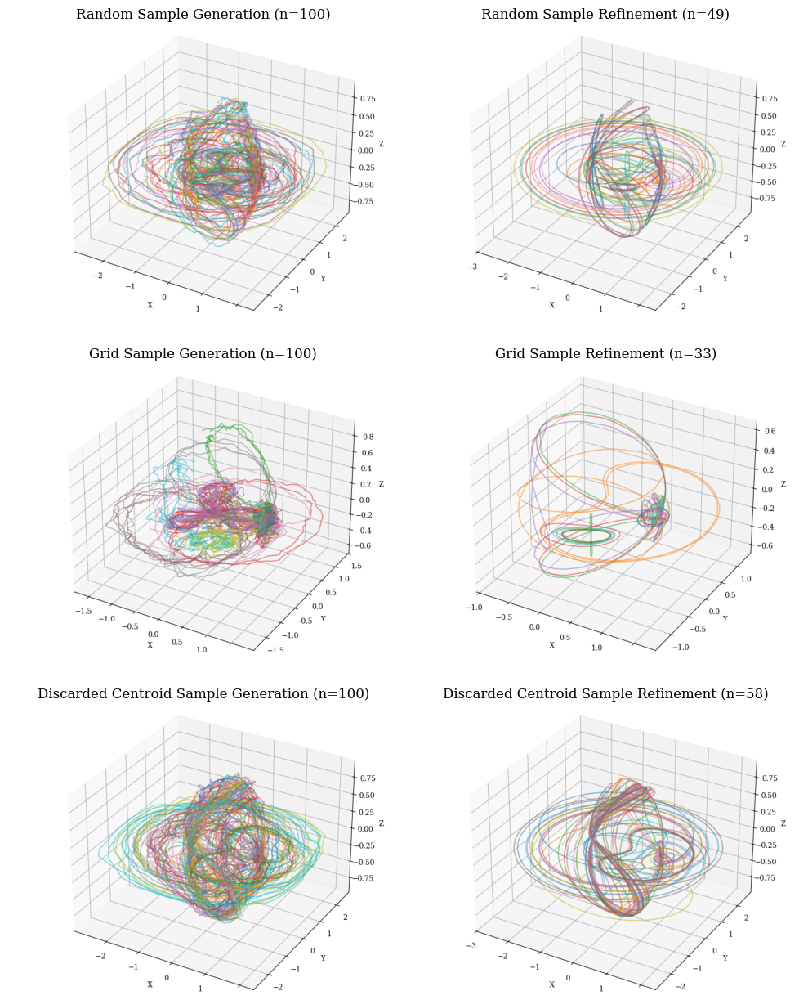

In [53]:
create_image_grid_from_routes(orbits_paths, crop_length=123, hspace=-0.35, label_images=label_images)

In [54]:
orbits_paths_2 = [f'{experiment_folder}/images/exp{experiment_id}_generated_orbits_that_converged.png',
                f'{experiment_folder}/images/exp{experiment_id}_refined_orbits.png']

label_images_2 = ['Generated Orbits that Converged', 'All Converged Orbits']

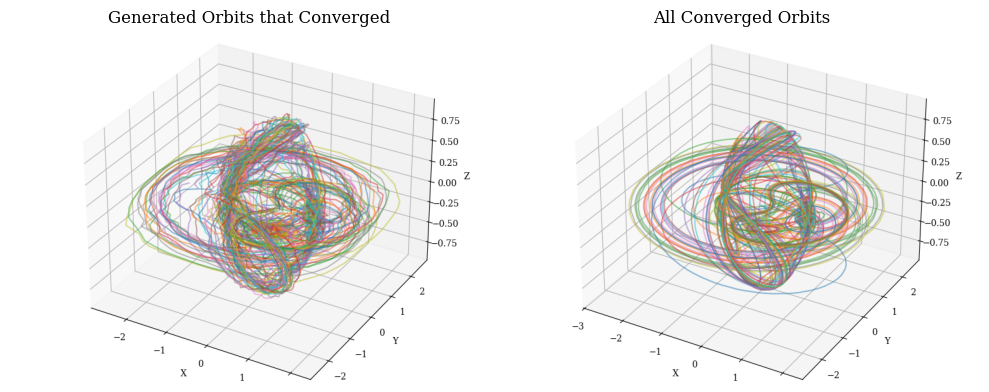

In [55]:
create_image_grid_from_routes(orbits_paths_2, crop_length=123, hspace=0.2, label_images=label_images_2, grid_size=(1,2))

# Latent Space

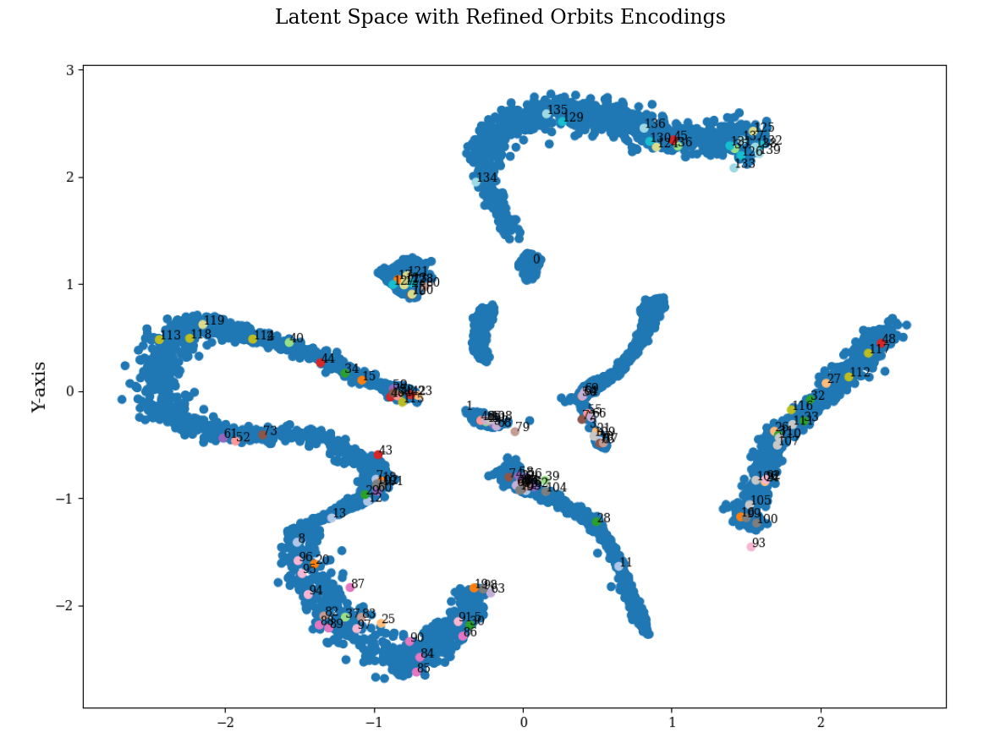

In [56]:
ls_path = f'{experiment_folder}/images/exp{experiment_id}_combined_latent_space.png'
plot_single_image(ls_path, crop_length=70, title='Latent Space with Refined Orbits Encodings')

## Feature Space

In [57]:
results = np.array([jacobi_constant(np.transpose(full_data[:,1:,:],(0,2,1))[i][0], EM_MU)[0] for i in range(full_data.shape[0])])
full_orbit_df['calculated_jacobi'] = results

features_used = ['period', 'calculated_jacobi']

dataset_features = full_orbit_df[features_used].values
refined_orbits_features = refined_orbits_df[features_used].values
refined_orbits_features.shape

(140, 2)

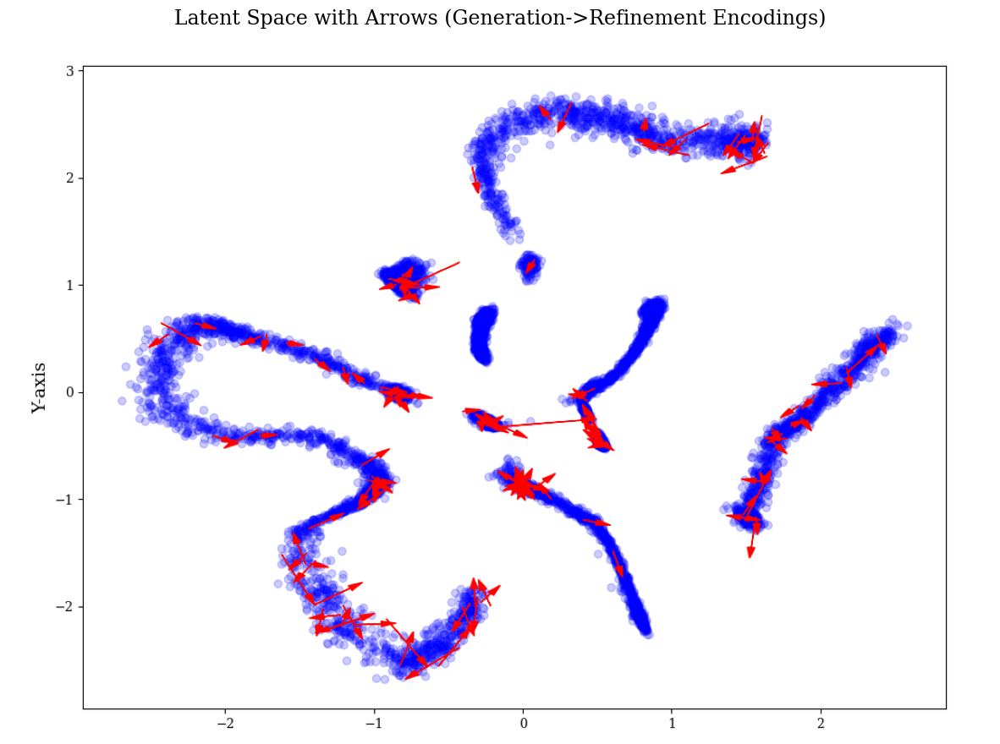

In [58]:
ls_arrows_path = f'{images_folder}/exp{experiment_id}_combined_latent_space_arrows.png'
plot_single_image(ls_arrows_path, crop_length=70, title='Latent Space with Arrows (Generation->Refinement Encodings)')

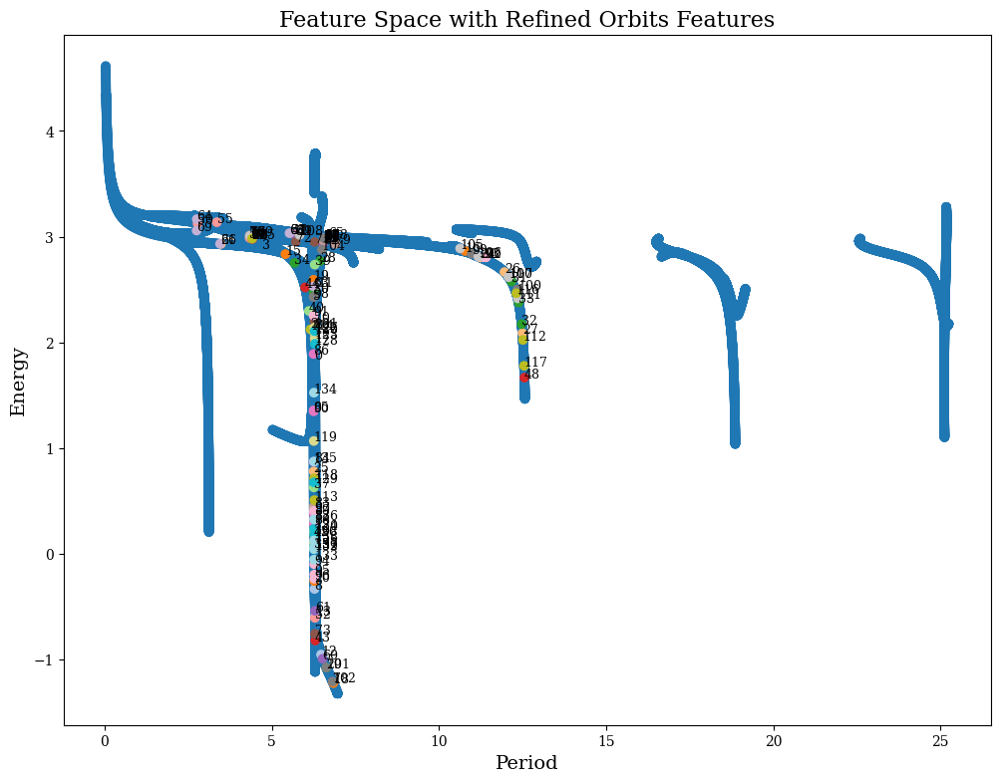

In [59]:
plot_combined_2d_latent_space(dataset_features, refined_orbits_features, title= 'Feature Space with Refined Orbits Features',
                              synthetic_labels=list(range(0, len(refined_orbits_df))),
                              annotation_mode='numbers', axis_labels=('Period', 'Energy'))

# Regression

In [60]:
latent_means.shape

(11367, 2)

In [61]:
latent_stdevs.shape

(11367, 2)

In [62]:
features.shape

(11367, 3)

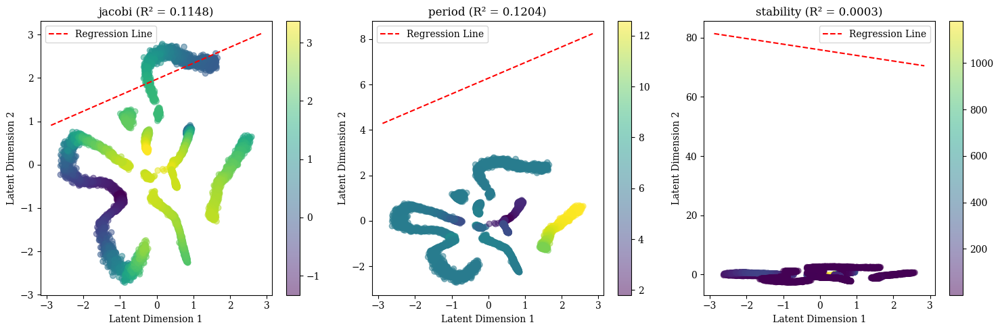

({'jacobi': {'coefficients': array([ 0.36927631, -0.15653172], dtype=float32), 'intercept': np.float32(1.9712033), 'r_squared': 0.11475946389552982}, 'period': {'coefficients': array([ 0.6900863 , -0.22431262], dtype=float32), 'intercept': np.float32(6.2745085), 'r_squared': 0.12040323692247623}, 'stability': {'coefficients': array([-1.8975742 ,  0.45902473], dtype=float32), 'intercept': np.float32(75.91592), 'r_squared': 0.00028954784047363624}}, {'regression_jacobi_r2': 0.11475946389552982, 'regression_period_r2': 0.12040323692247623, 'regression_stability_r2': 0.00028954784047363624})


In [63]:
results = plot_linear_regression(latent_means, features, feature_names)
print(results)

# ML Discovery

## Imports

In [64]:
with open("../../models/02_fam_class_fgsc_rf.pkl", "rb") as f:
    rf_model = pickle.load(f)

In [65]:
orbit_scaler = joblib.load('../../data/orbit_scaler.pkl')
input_scaler = joblib.load('../../data/input_scaler.pkl')

## Create Input

In [66]:
scaled_refined_orbits = orbit_scaler.transform(torch.tensor(refined_orbits, dtype=torch.float32))
scaled_refined_orbits = scaled_refined_orbits.numpy()
scaled_refined_orbits = scaled_refined_orbits[:,1:,:]
scaled_refined_orbits.shape

(140, 6, 100)

In [67]:
position_stats = calculate_per_orbit_spatial_statistics(scaled_refined_orbits)
position_stats = position_stats.reshape(position_stats.shape[0], -1)
position_stats.shape

(140, 36)

In [68]:
feature_names = ['period', 'calculated_jacobi']
features = refined_orbits_df[feature_names].values
features.shape

(140, 2)

In [69]:
# concatenate features and position stats
features_pos_stats = np.concatenate([features, position_stats], axis=1)
features_pos_stats.shape

(140, 38)

In [70]:
scaled_features_pos_stats = input_scaler.transform(features_pos_stats)
scaled_features_pos_stats.shape

(140, 38)

## Predict

In [71]:
predictions = rf_model.predict(scaled_features_pos_stats)
predictions.shape

(140,)

## Analyze

In [72]:
refined_orbits_df['family_classification'] = predictions
refined_orbits_df.head()

,id,old_period,period,iterations_convergence,error,initial_pos_x0,initial_pos_y0,initial_pos_z0,initial_vel_x0,initial_vel_y0,initial_vel_z0,final_pos_x0,final_pos_y0,final_pos_z0,final_vel_x0,final_vel_y0,final_vel_z0,disorder_metric,correct_order,inversions,kendall_tau_distance,propagated_position_error,propagated_velocity_error,propagated_energy_error,latent_distance_to_generation,calculated_jacobi,period_distance_with_generation,feature_closest_orbit,feature_distance_from_closest_orbit,nearest_orbit,nearest_orbit_distance,distance_from_generation,centroid_distance,feature_centroid_distance,closest_family_centroid,closest_family_centroid_distance,closest_family_feature_centroid,closest_family_feature_centroid_distance,initial_conditions_distance,closest_family_full_centroid,closest_family_full_centroid_distance,family_of_feature_closest_orbit,family_of_closest_orbit,family_classification
0,0,5.970095,6.261689,14,2.177359e-11,-1.672384,0.197360,-0.004944,-0.131479,2.013470,0.002885,-1.890881,-0.075624,3.156304e-03,-0.078437,1.672169,-6.984244e-02,94.0,80.0,57.0,0.023030,1.519432e-12,5.385060e-12,9.521093e-13,0.042681,1.845175,0.291594,20211,0.000121,20217,3.169317,3.986457,1.201150,1.138238,9,0.733003,18,0.184543,0.496906,19,0.501979,17.0,17.0,17.0
1,1,5.762555,6.747913,13,1.172315e-12,1.146281,0.012663,0.119440,0.007081,-0.226648,0.241234,1.016803,0.004804,2.605369e-01,-0.032308,-0.023131,1.086547e-01,236.0,71.0,158.0,0.063838,2.061160e-12,5.886800e-12,8.540419e-14,0.022202,2.986561,0.985357,1496,0.011063,2777,3.292461,3.143534,0.395551,0.771247,0,0.178532,35,0.404108,0.311901,2,0.178617,2.0,3.0,3.0
2,6,6.125951,6.156255,7,2.363295e-12,1.043744,-0.064992,0.037998,-0.078029,-0.525581,0.715356,1.081223,-0.016988,2.534353e-02,-0.064532,-0.580450,8.675794e-01,28.0,87.0,14.0,0.005657,1.385793e-12,4.312269e-12,1.557156e-12,0.064102,2.141212,0.030304,18913,0.000408,18915,0.858896,1.733873,1.764993,1.128089,3,0.399080,29,0.160346,0.173879,15,0.394888,16.0,16.0,16.0
3,7,4.687366,4.729179,11,1.505815e-12,1.097317,0.007104,-0.004319,-0.041922,-0.228566,-0.155920,1.225314,-0.240151,3.673249e-15,-0.252196,-0.510227,8.882345e-15,486.0,66.0,323.0,0.130505,1.739751e-12,3.280340e-12,5.691519e-14,0.164957,2.886419,0.041812,28511,0.003577,13907,4.619803,4.623523,0.586623,2.569823,2,0.210171,11,0.383418,0.474759,32,0.057855,26.0,12.0,24.0
4,9,6.172528,6.571012,8,2.488562e-13,0.469477,-0.878074,-0.014306,-0.280210,-0.131603,0.019204,0.485121,-1.017461,-4.596324e-14,-0.231256,-0.097450,-7.265335e-13,82.0,82.0,55.0,0.022222,3.035552e-12,5.311197e-12,4.447172e-14,0.014222,2.985590,0.398484,29883,0.000099,29886,0.509034,1.615098,0.878932,0.896547,2,0.616545,35,0.238286,0.154304,39,0.092489,28.0,28.0,28.0


In [73]:
def plot_family_classification_matches(refined_orbits_df, classification_column):
    # Calculate counts
    ml_family_counts = refined_orbits_df[classification_column].value_counts()
    family_of_closest_counts = refined_orbits_df['family_of_closest_orbit'].value_counts()
    family_of_feature_counts = refined_orbits_df['family_of_feature_closest_orbit'].value_counts()

    # Calculate matches
    matches_closest = (refined_orbits_df[classification_column] == refined_orbits_df['family_of_closest_orbit']).sum()
    matches_feature = (refined_orbits_df[classification_column] == refined_orbits_df['family_of_feature_closest_orbit']).sum()

    # Calculate percentages
    total_count = len(refined_orbits_df)
    percent_closest = (matches_closest / total_count) * 100
    percent_feature = (matches_feature / total_count) * 100

    # Prepare data for plotting
    labels = ['Matches with Closest Orbit', 'Matches with Feature Closest Orbit']
    counts = [matches_closest, matches_feature]
    percentages = [percent_closest, percent_feature]

    # Create a bar plot
    x = range(len(labels))
    fig, ax1 = plt.subplots()

    # Bar plot for counts
    bars = ax1.bar(x, counts, color=['blue', 'orange'], alpha=0.7, label='Count')
    ax1.set_xticks(x)
    ax1.set_xticklabels(labels)
    ax1.set_ylabel('Count')
    ax1.set_ylim(0, total_count)
    ax1.set_title('Comparison of ml_family_classification Matches')

    # Add count and percentage on top of the bars
    for bar, count, percent in zip(bars, counts, percentages):
        yval = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2, yval, f'{count}\n({percent:.1f}%)', ha='center', va='bottom')

    # Create a second y-axis for percentages
    ax2 = ax1.twinx()
    ax2.set_ylim(0, 100)  # Set y-axis limit for percentage
    ax2.set_ylabel('Percentage (%)')

    # Adjust the ticks on the second y-axis to match the percentage scale
    ax2.set_yticks(range(0, 101, 10))

    plt.grid(axis='y')
    plt.show()

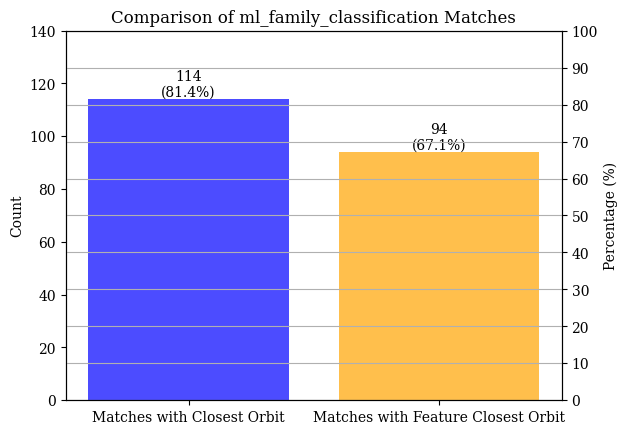

In [74]:
plot_family_classification_matches(refined_orbits_df, 'family_classification')

## Visualization

In [75]:
refined_orbits_df['svm_discovered'] = refined_orbits_df.apply(
    lambda row: row['family_classification'] in discarded_family_ids, axis=1
)

In [76]:
ml_discovery_df = refined_orbits_df[refined_orbits_df['svm_discovered']]
ml_discovery_df.shape

(24, 45)

In [77]:
ml_discovery_df.head()

,id,old_period,period,iterations_convergence,error,initial_pos_x0,initial_pos_y0,initial_pos_z0,initial_vel_x0,initial_vel_y0,initial_vel_z0,final_pos_x0,final_pos_y0,final_pos_z0,final_vel_x0,final_vel_y0,final_vel_z0,disorder_metric,correct_order,inversions,kendall_tau_distance,propagated_position_error,propagated_velocity_error,propagated_energy_error,latent_distance_to_generation,calculated_jacobi,period_distance_with_generation,feature_closest_orbit,feature_distance_from_closest_orbit,nearest_orbit,nearest_orbit_distance,distance_from_generation,centroid_distance,feature_centroid_distance,closest_family_centroid,closest_family_centroid_distance,closest_family_feature_centroid,closest_family_feature_centroid_distance,initial_conditions_distance,closest_family_full_centroid,closest_family_full_centroid_distance,family_of_feature_closest_orbit,family_of_closest_orbit,family_classification,svm_discovered
3,7,4.687366,4.729179,11,1.505815e-12,1.097317,0.007104,-0.004319,-0.041922,-0.228566,-0.155920,1.225314,-0.240151,3.673249e-15,-0.252196,-0.510227,8.882345e-15,486.0,66.0,323.0,0.130505,1.739751e-12,3.280340e-12,5.691519e-14,0.164957,2.886419,0.041812,28511,0.003577,13907,4.619803,4.623523,0.586623,2.569823,2,0.210171,11,0.383418,0.474759,32,0.057855,26.0,12.0,24.0,True
13,25,6.267957,6.302419,7,9.250269e-14,0.649462,-0.208975,0.530647,-0.513931,-1.248690,-0.129627,0.790788,-0.079026,6.030065e-01,-0.156995,-1.787661,-2.697504e-02,42.0,86.0,22.0,0.008889,8.133294e-13,3.401231e-12,1.153735e-14,0.180229,-0.578043,0.034462,23907,0.001589,23910,2.629421,2.952479,1.723198,3.129967,5,0.564602,20,0.808687,0.685949,20,0.561912,21.0,21.0,29.0,True
17,37,6.239189,6.290220,11,3.334062e-10,0.260018,0.098357,0.015612,0.178856,4.377156,0.054999,0.120657,0.006759,-5.916706e-10,-0.091344,3.591929,-5.746297e-09,54.0,85.0,30.0,0.012121,1.984281e-12,1.152517e-11,3.911712e-10,0.065939,2.001509,0.051031,34126,0.000160,34285,3.288539,3.734941,1.320080,1.043808,7,0.021554,29,0.045338,0.848922,29,0.022563,32.0,32.0,5.0,True
19,42,5.897058,6.250497,8,1.556177e-12,-0.387796,-0.177516,0.415901,-0.148452,0.333273,-0.034302,-0.790730,0.007751,6.170293e-01,0.015614,-0.213484,2.258046e-02,74.0,79.0,41.0,0.016566,9.883372e-13,1.440183e-12,1.159925e-13,0.171978,2.592593,0.353439,24623,0.000589,24624,1.010222,2.718212,1.860177,1.020397,5,0.676565,19,0.047427,0.752482,26,0.551578,21.0,21.0,18.0,True
21,44,4.465792,3.481283,10,1.619572e-12,1.104547,0.021965,0.002849,0.033624,-0.177650,-0.138198,1.193513,0.025744,-6.507856e-16,0.039781,-0.509153,1.350955e-15,452.0,66.0,315.0,0.127273,8.151772e-13,2.023008e-12,3.685492e-14,0.063433,2.931873,0.984509,5447,0.002069,13907,2.884701,3.419481,0.645886,3.808788,2,0.262831,6,0.546015,0.370092,32,0.069004,5.0,12.0,15.0,True


In [78]:
ml_discovery_df['family_classification'].value_counts()

family_classification
5.0     9
15.0    4
11.0    4
24.0    1
29.0    1
18.0    1
26.0    1
22.0    1
13.0    1
1.0     1
Name: count, dtype: int64

In [79]:
import numpy as np

def visualize_family_orbits(hard_discovery_df, orbits_id_classes, family, dataset_n=150, shared_scale=True):
    family_label = get_orbit_classes([family])[0][0]

    def get_indexes_by_value(data, value, column=None):
        """Returns the indexes of rows where the specified column has the given value.
        Works with both DataFrames, lists of dictionaries, simple lists, and numpy arrays."""
        if isinstance(data, pd.DataFrame):
            if column is not None:
                return data.index[data[column] == value].tolist()
            else:
                raise ValueError("Column must be specified for DataFrame.")
        elif isinstance(data, list):
            if column is None:
                return [index for index, item in enumerate(data) if item == value]
        elif isinstance(data, np.ndarray):
            if column is not None:
                raise ValueError("Column specification is not applicable for numpy arrays.")
            return np.where(data == value)[0].tolist()

    # Get synthetic orbits
    family_indexes = get_indexes_by_value(hard_discovery_df, family, 'family_classification')
    reordered_family_orbits, _, _ = reorder_orbits(refined_orbits[family_indexes])
    synthetic_orbits = reordered_family_orbits[:,1:]

    # Get real orbits
    real_family_indexes = get_indexes_by_value(orbits_id_classes, family)
    sampled_orbit_indexes = np.random.choice(real_family_indexes, size=min(dataset_n, len(real_family_indexes)), replace=False)
    real_orbits = full_data[sampled_orbit_indexes, 1:]

    # Visualize both sets side by side
    visualize_orbits_comparison(
        real_orbits,
        synthetic_orbits, 
        title1=f'Dataset Family: {family_label}',
        title2=f'Synthetic Orbits classified as {family_label}',
        shared_scale=shared_scale
    )

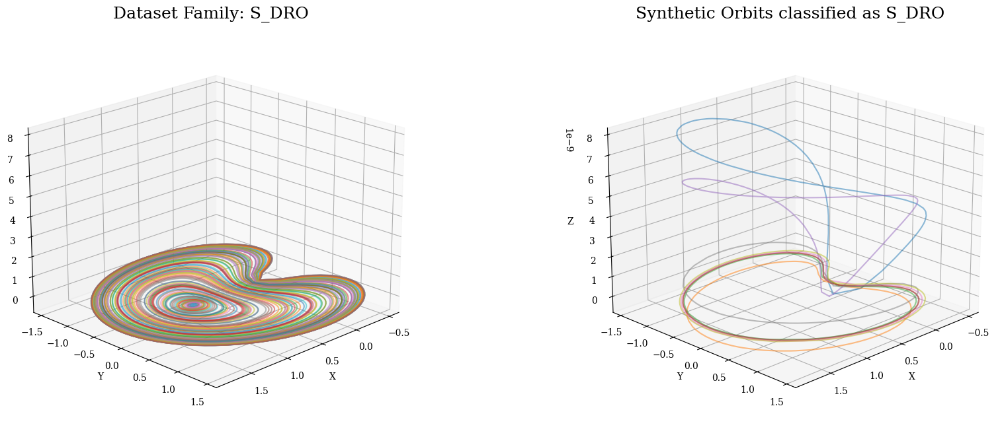

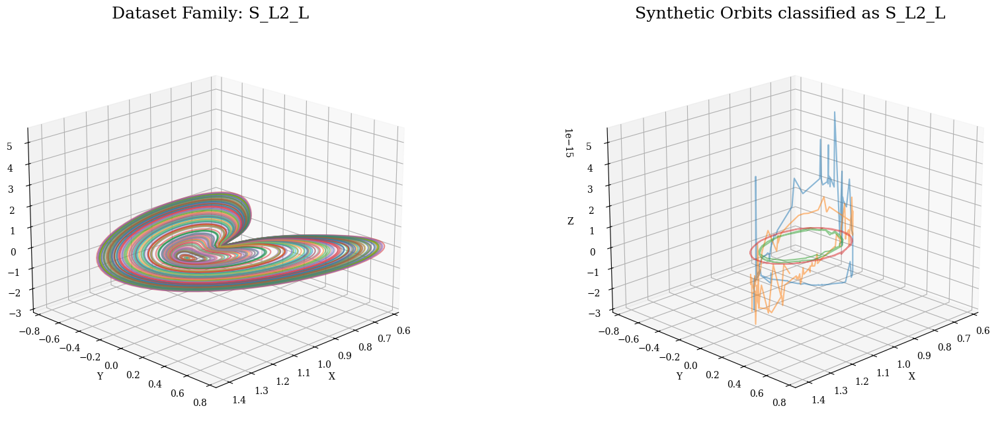

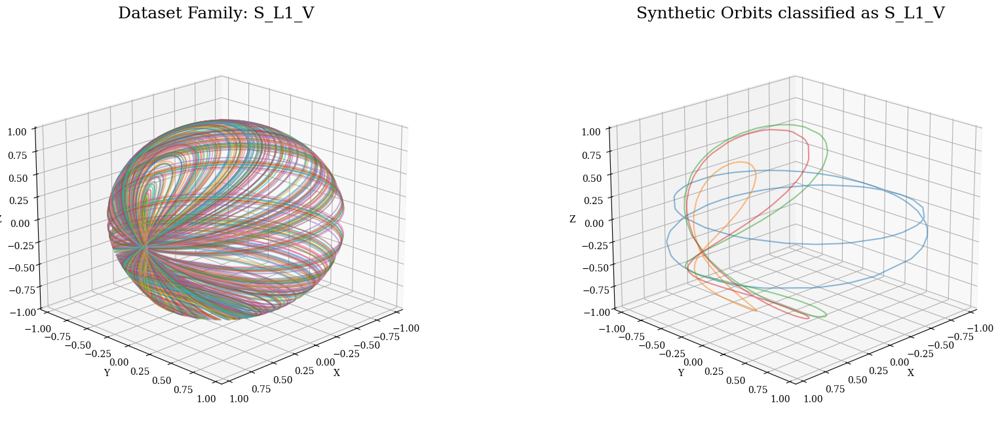

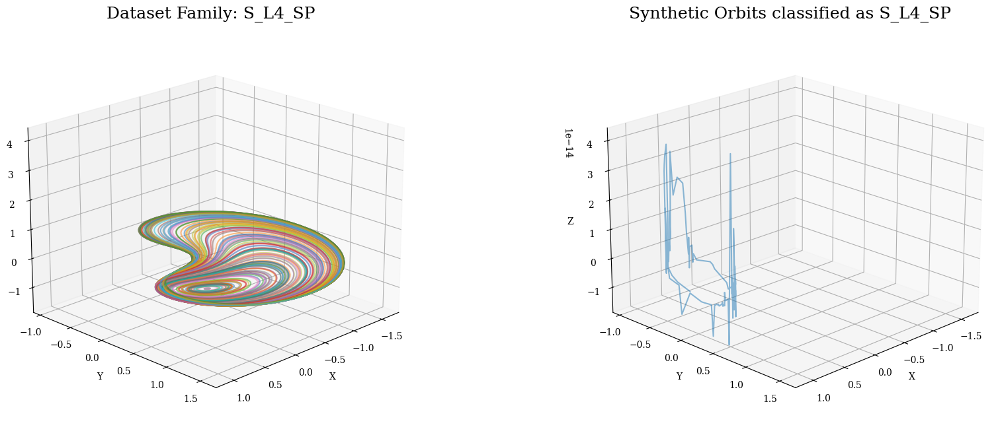

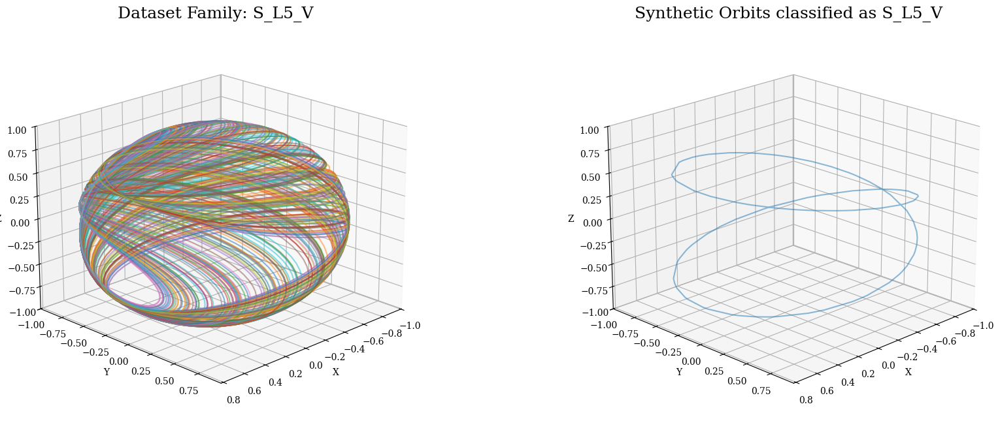

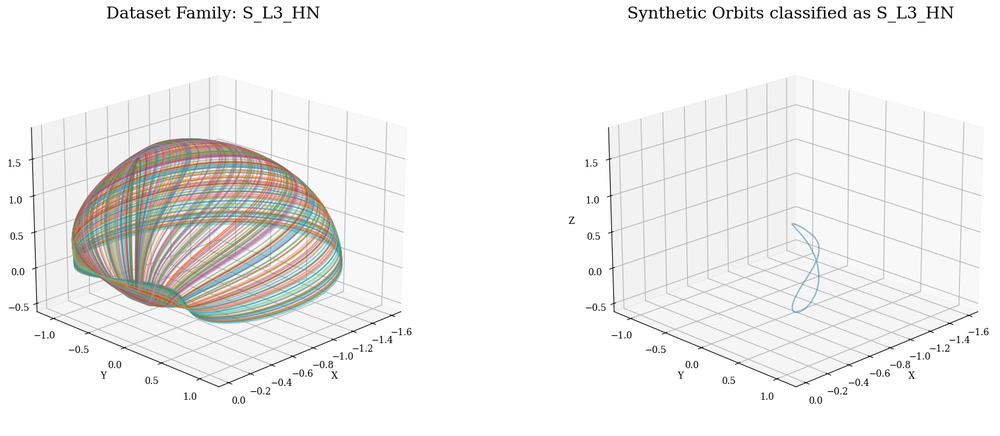

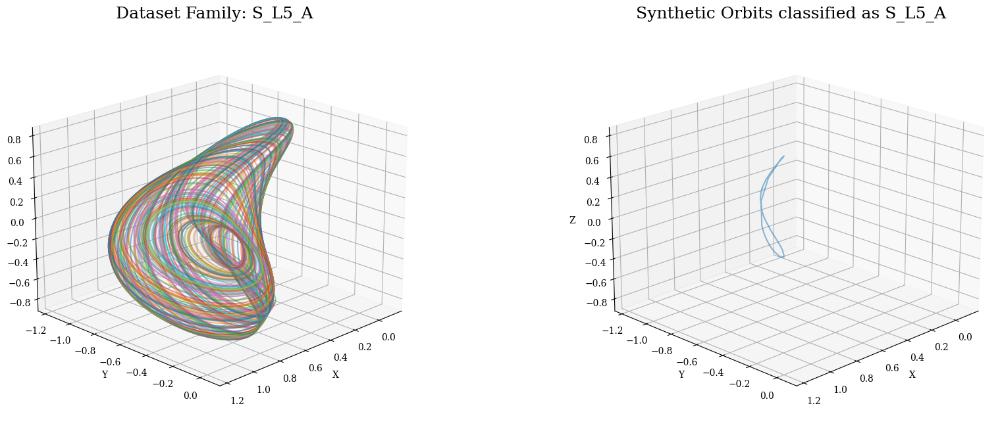

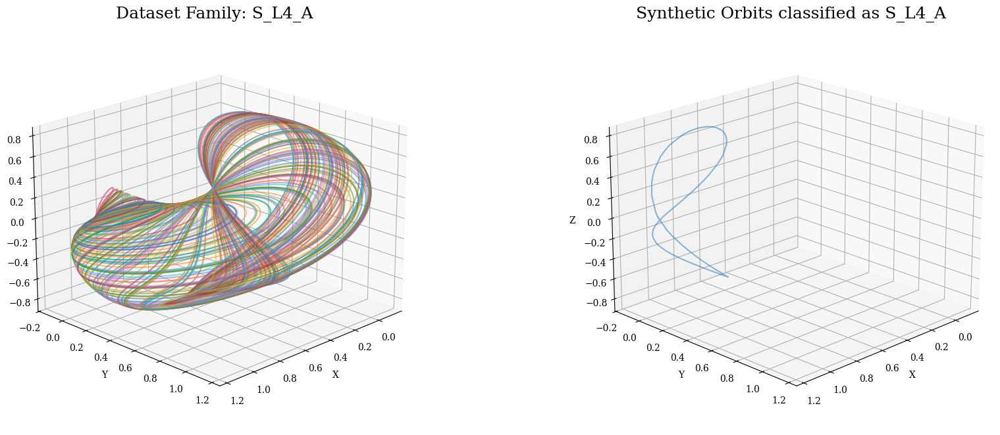

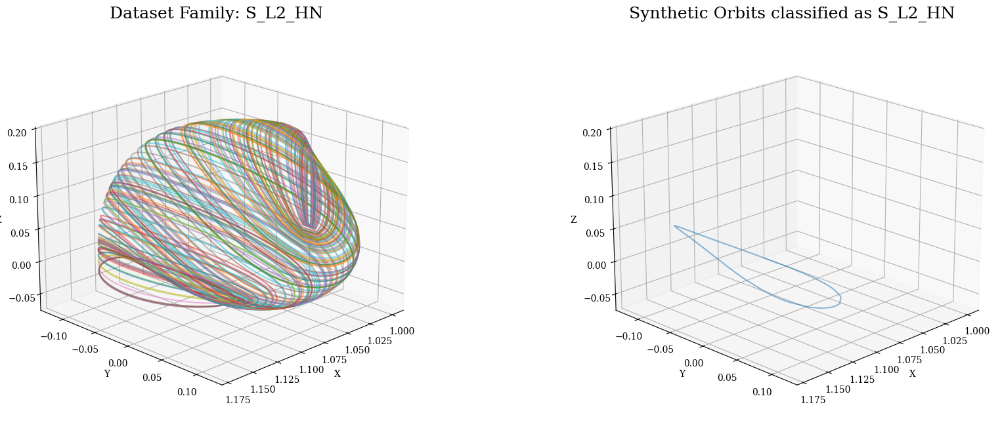

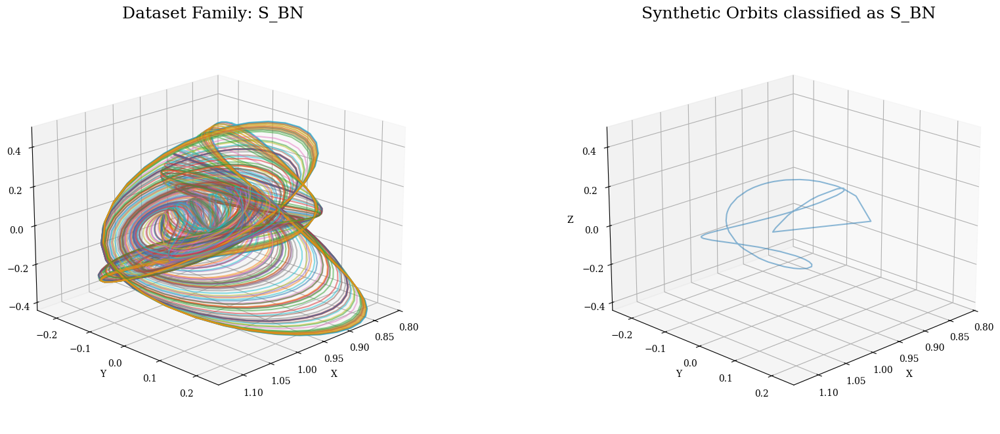

In [80]:
for family in  ml_discovery_df['family_classification'].value_counts().keys():
    visualize_family_orbits(ml_discovery_df, full_orbits_id_classes, family=family)

# Distance Discovery

## Calculations

In [81]:
filter_condition = refined_orbits_df[['family_of_feature_closest_orbit', 'family_of_closest_orbit']].isin(discarded_family_ids).any(axis=1)
distance_discovery_df = refined_orbits_df[filter_condition]
distance_discovery_df.shape

(30, 45)

In [82]:
distance_discovery_df.head()

,id,old_period,period,iterations_convergence,error,initial_pos_x0,initial_pos_y0,initial_pos_z0,initial_vel_x0,initial_vel_y0,initial_vel_z0,final_pos_x0,final_pos_y0,final_pos_z0,final_vel_x0,final_vel_y0,final_vel_z0,disorder_metric,correct_order,inversions,kendall_tau_distance,propagated_position_error,propagated_velocity_error,propagated_energy_error,latent_distance_to_generation,calculated_jacobi,period_distance_with_generation,feature_closest_orbit,feature_distance_from_closest_orbit,nearest_orbit,nearest_orbit_distance,distance_from_generation,centroid_distance,feature_centroid_distance,closest_family_centroid,closest_family_centroid_distance,closest_family_feature_centroid,closest_family_feature_centroid_distance,initial_conditions_distance,closest_family_full_centroid,closest_family_full_centroid_distance,family_of_feature_closest_orbit,family_of_closest_orbit,family_classification,svm_discovered
1,1,5.762555,6.747913,13,1.172315e-12,1.146281,0.012663,0.119440,0.007081,-0.226648,0.241234,1.016803,0.004804,2.605369e-01,-0.032308,-0.023131,1.086547e-01,236.0,71.0,158.0,0.063838,2.061160e-12,5.886800e-12,8.540419e-14,0.022202,2.986561,0.985357,1496,0.011063,2777,3.292461,3.143534,0.395551,0.771247,0,0.178532,35,0.404108,0.311901,2,0.178617,2.0,3.0,3.0,False
3,7,4.687366,4.729179,11,1.505815e-12,1.097317,0.007104,-0.004319,-0.041922,-0.228566,-0.155920,1.225314,-0.240151,3.673249e-15,-0.252196,-0.510227,8.882345e-15,486.0,66.0,323.0,0.130505,1.739751e-12,3.280340e-12,5.691519e-14,0.164957,2.886419,0.041812,28511,0.003577,13907,4.619803,4.623523,0.586623,2.569823,2,0.210171,11,0.383418,0.474759,32,0.057855,26.0,12.0,24.0,True
9,16,6.528803,6.570699,10,3.835939e-14,0.427496,-0.936014,-0.004755,-0.315845,0.101363,-0.027506,0.497595,-1.013998,-1.657932e-14,-0.231612,-0.106625,-1.248178e-14,266.0,75.0,188.0,0.075960,2.894810e-12,4.941286e-12,3.018909e-15,0.082064,2.985193,0.041896,26691,0.000118,29885,0.928135,1.814572,0.927912,0.896527,2,0.639502,35,0.237827,0.249257,39,0.118382,24.0,28.0,28.0,False
11,21,6.023031,6.371288,13,1.399211e-10,0.179075,-1.428248,0.013620,-0.977275,-0.185913,-0.006427,0.427502,-1.528860,8.835852e-12,-1.012535,-0.485334,5.527849e-12,226.0,72.0,143.0,0.057778,2.659393e-12,5.263543e-12,3.917585e-12,0.152612,2.528259,0.348258,26180,0.000533,29396,4.343660,3.749823,1.767455,0.890735,6,0.253451,25,0.034936,0.403686,37,0.245939,24.0,28.0,28.0,False
14,29,6.610111,6.561818,9,2.261375e-13,0.359305,-0.840463,0.004484,-0.332252,0.031686,0.005566,0.530488,-1.047181,3.333963e-14,-0.294212,-0.161974,7.351506e-15,106.0,80.0,66.0,0.026667,3.166916e-12,5.623738e-12,5.539901e-15,0.107038,2.973616,0.048293,26656,0.000131,29845,0.904452,1.983891,0.855927,0.895902,2,0.575371,35,0.224734,0.333224,39,0.048375,24.0,28.0,28.0,False


In [83]:
# Stack discovered orbits with their feature closest and nearest orbits
refinement_indexes = distance_discovery_df.index.to_list()
feature_closest_orbit_indexes = distance_discovery_df['feature_closest_orbit'].to_list()
nearest_orbit_indexes = distance_discovery_df['nearest_orbit'].to_list()

discovery_refinement = reordered_refined_orbits[refinement_indexes]
feature_closest_orbits = full_data[feature_closest_orbit_indexes]
nearest_orbits = full_data[nearest_orbit_indexes]

refinement_and_closers = np.stack(
    (discovery_refinement, feature_closest_orbits, nearest_orbits),
    axis=1
)
refinement_and_closers.shape

(30, 3, 7, 100)

In [84]:
refinement_and_closer = np.stack(
    (discovery_refinement, nearest_orbits),
    axis=1
)
refinement_and_closer.shape

(30, 2, 7, 100)

## Test on distance

Feature Closest Distance

In [85]:
# Get one orbit and its feature closest
random_orbit_index = 3
f1 = refined_orbits_features[random_orbit_index]
orbit_index = int(refined_orbits_df.iloc[3]['feature_closest_orbit'])
f2 = dataset_features[orbit_index]

In [86]:
refined_orbits_df['feature_distance_from_closest_orbit'].iloc[random_orbit_index]

np.float64(0.00357744595278)

In [87]:
calculate_distance(f1, f2)

np.float64(0.00357770654978698)

Spatial Closest distance

In [88]:
# Get one orbit and its feature closest
random_orbit_index = 3
orbit_index = int(refined_orbits_df.iloc[random_orbit_index]['nearest_orbit'])

In [89]:
refined_orbits_df['nearest_orbit_distance'].iloc[random_orbit_index]

np.float64(4.619802818897431)

In [90]:
orbits_distances(refined_orbits[random_orbit_index:random_orbit_index+1,1:], full_data[orbit_index:orbit_index+1,1:], distance_metric='euclidean')

array([4.61980282])

## Full Visualization

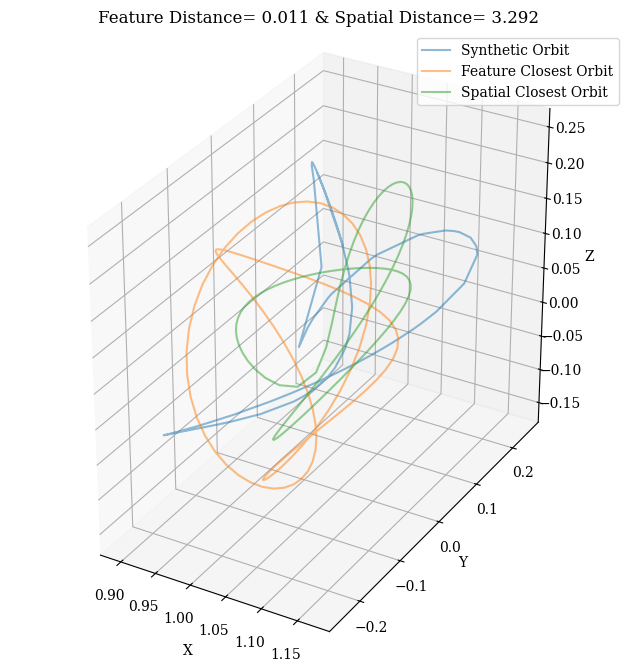

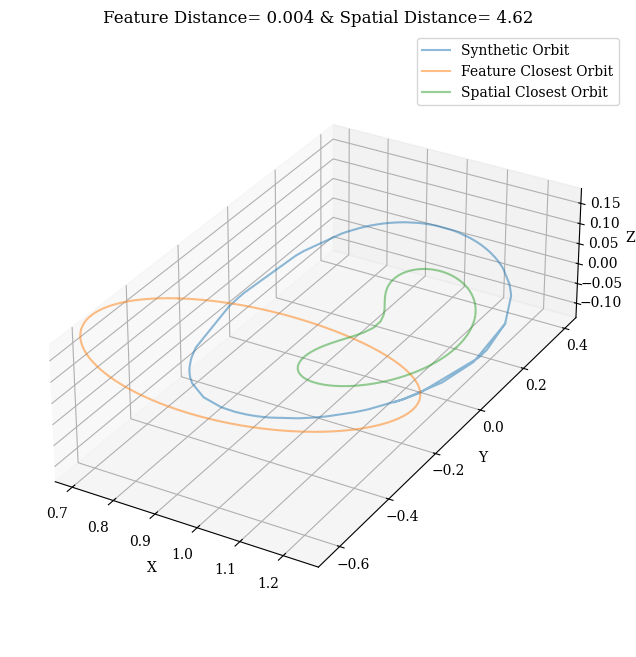

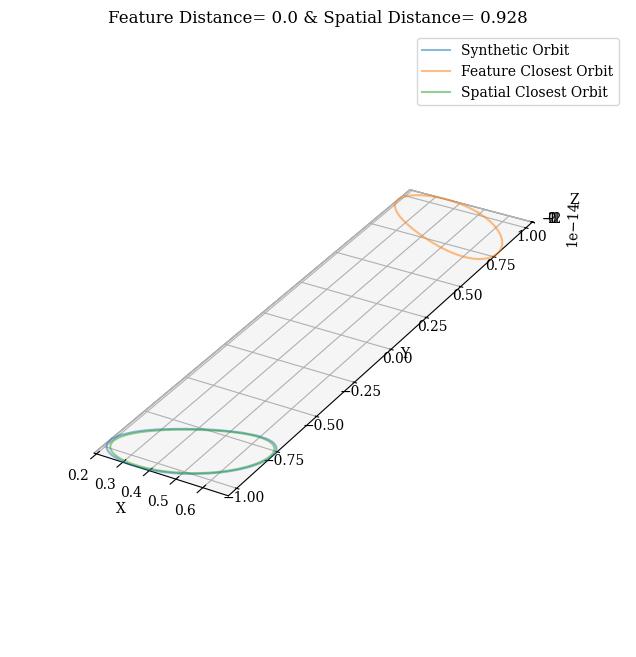

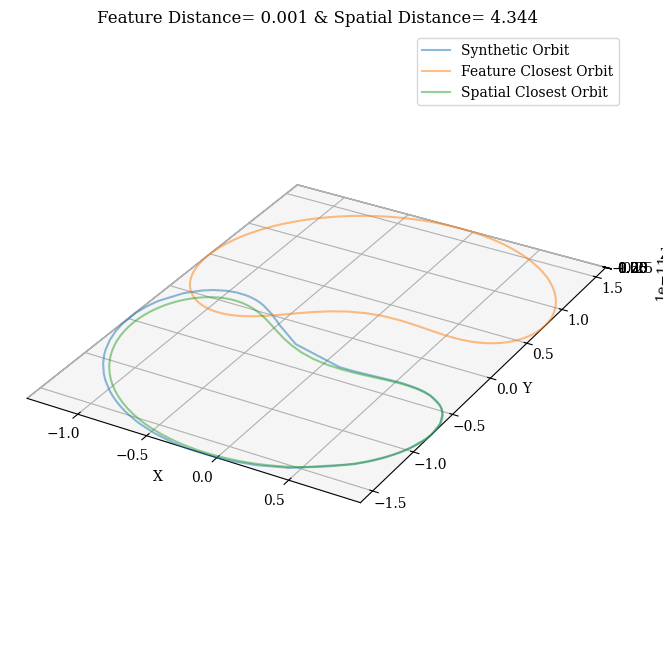

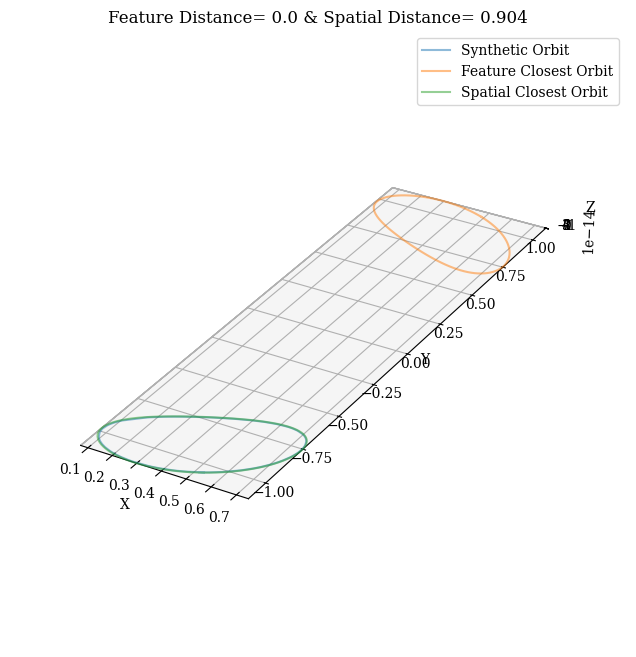

...

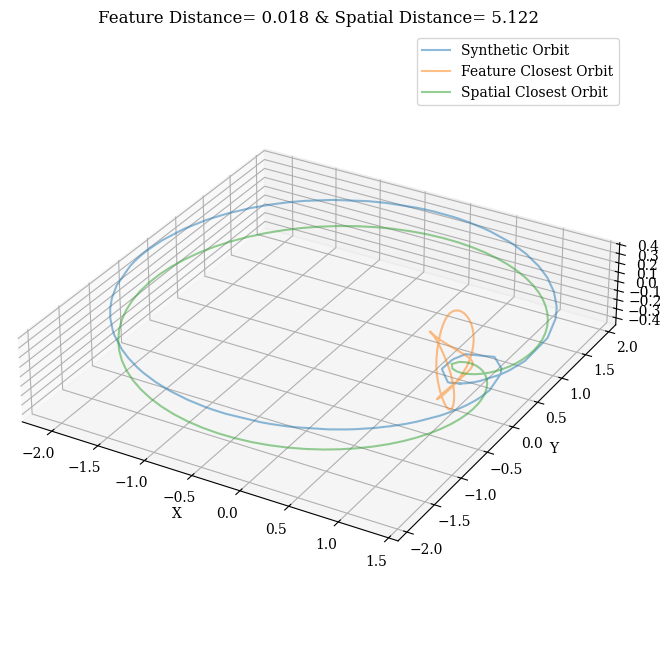

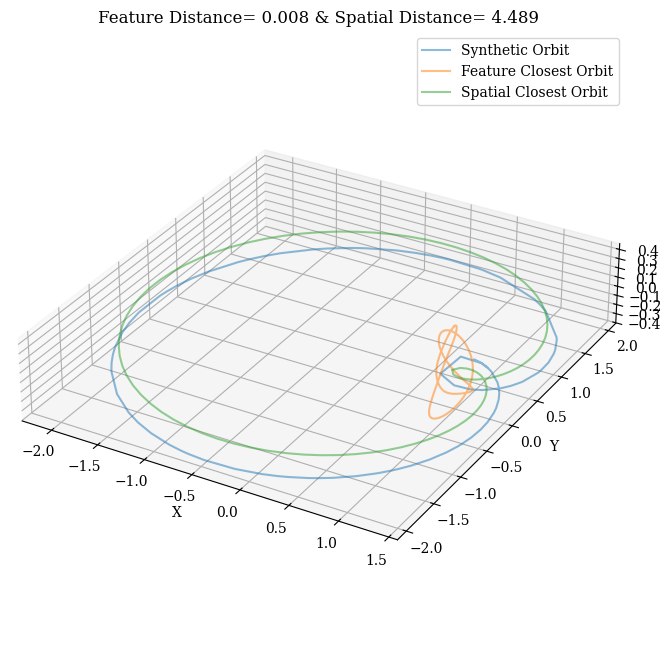

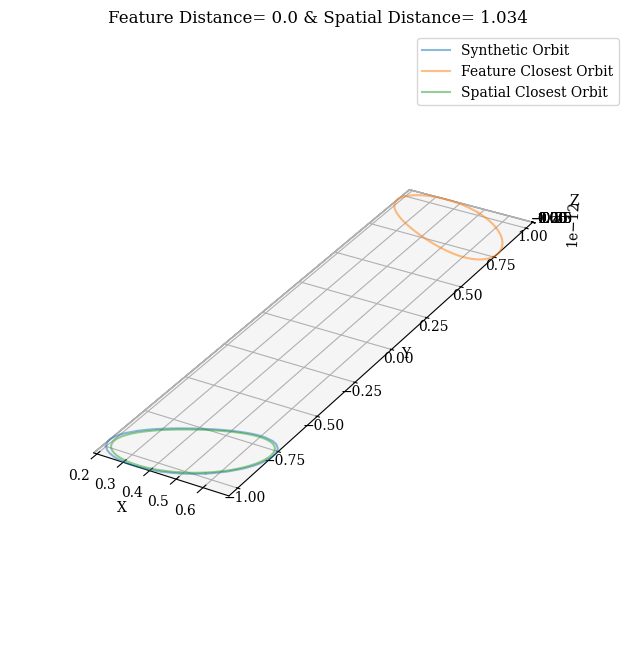

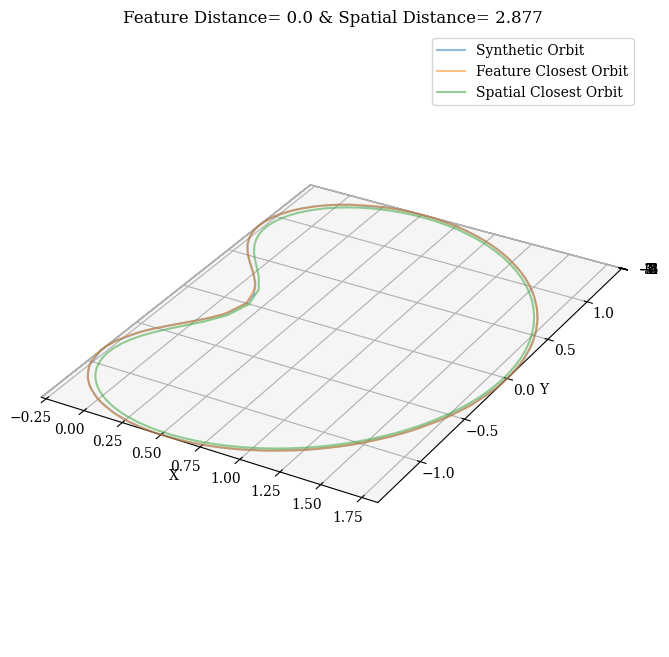

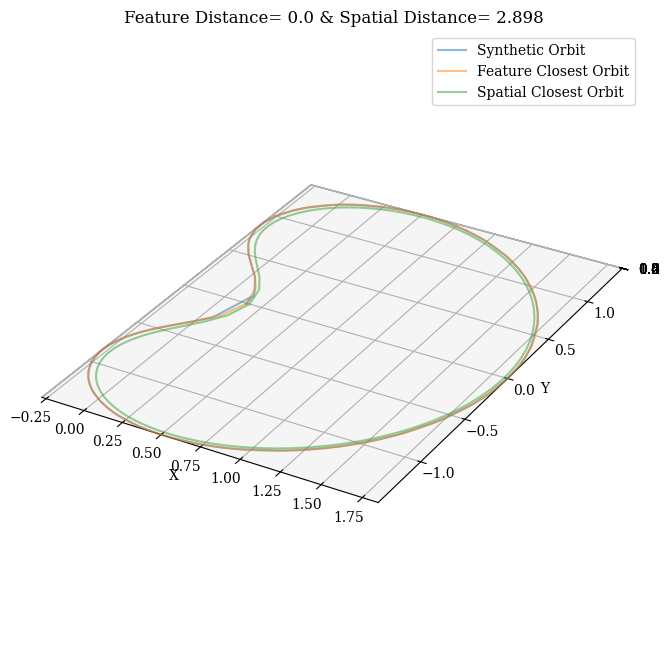

In [91]:
for i in range(len(refinement_and_closers)):
    title = f"Feature Distance= {distance_discovery_df['feature_distance_from_closest_orbit'].iloc[i].round(3)} & Spatial Distance= {distance_discovery_df['nearest_orbit_distance'].iloc[i].round(3)}"
    visualize_static_orbits(refinement_and_closers[i,:,1:,:], title=title,
                            orbit_names=['Synthetic Orbit', 'Feature Closest Orbit', 'Spatial Closest Orbit'], equal_aspect=True)

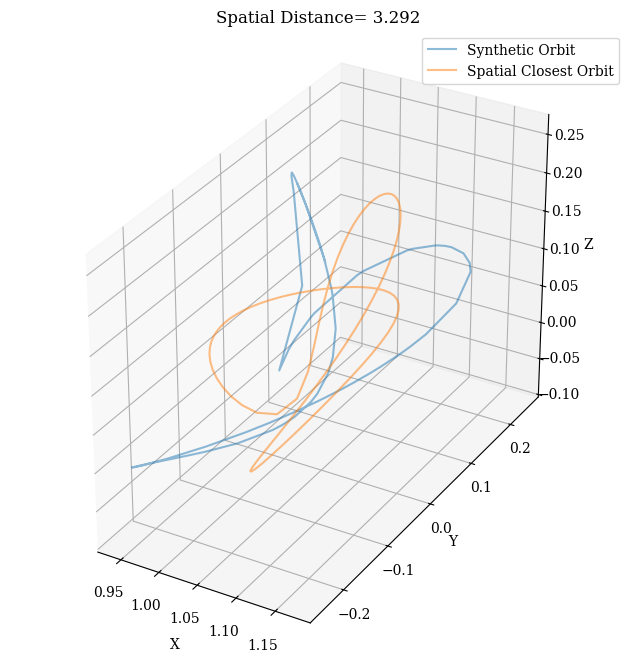

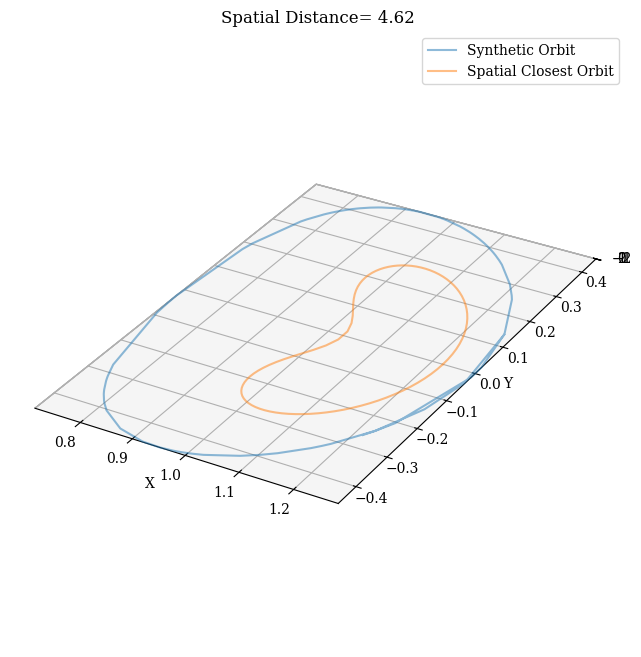

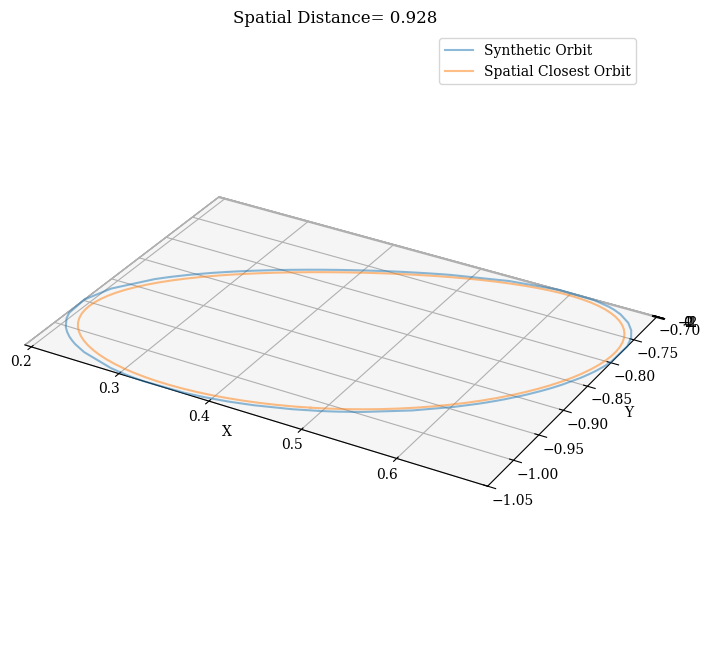

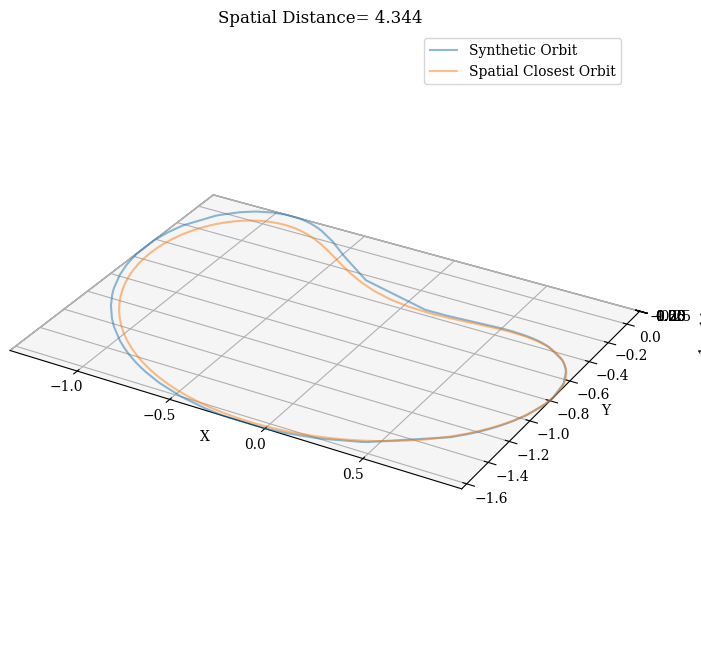

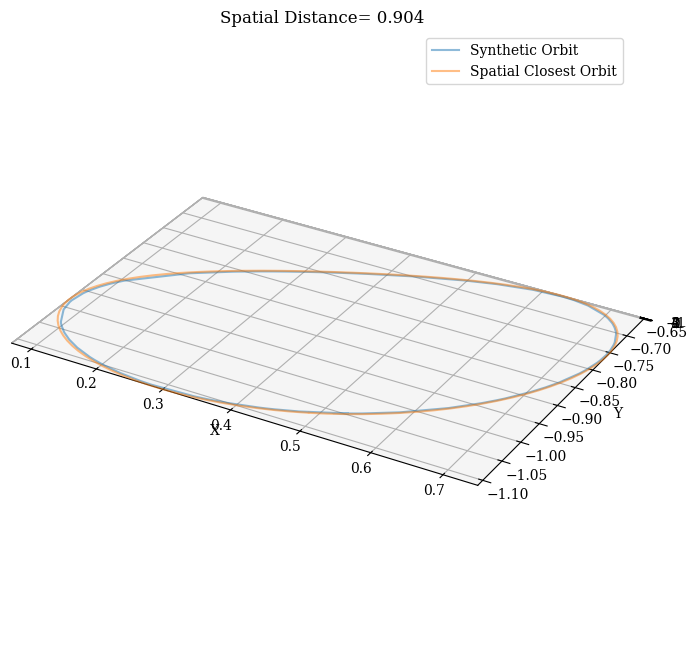

...

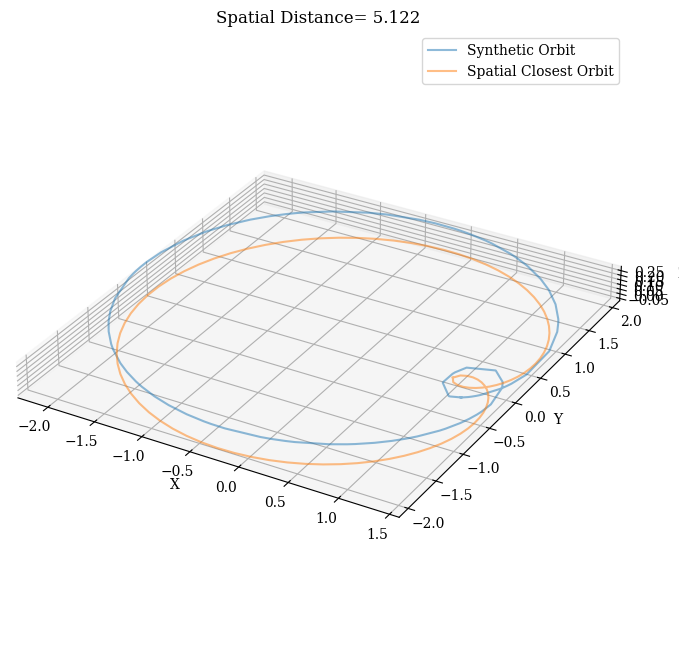

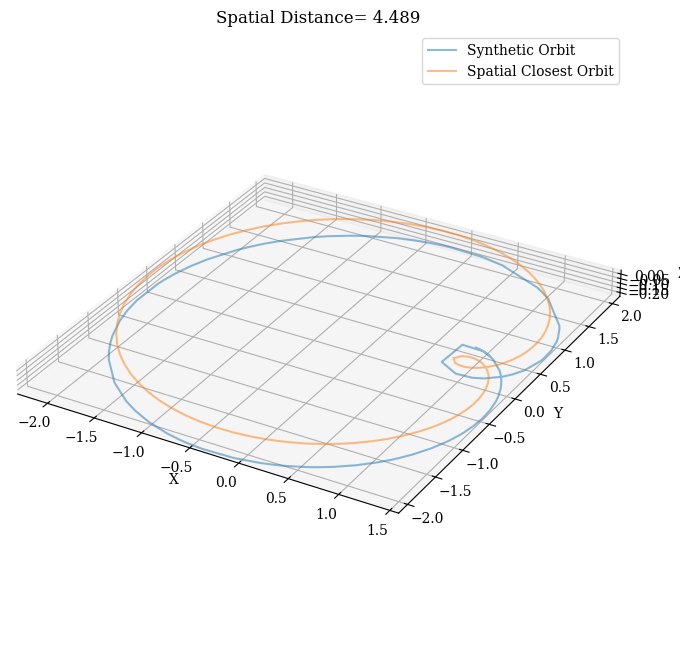

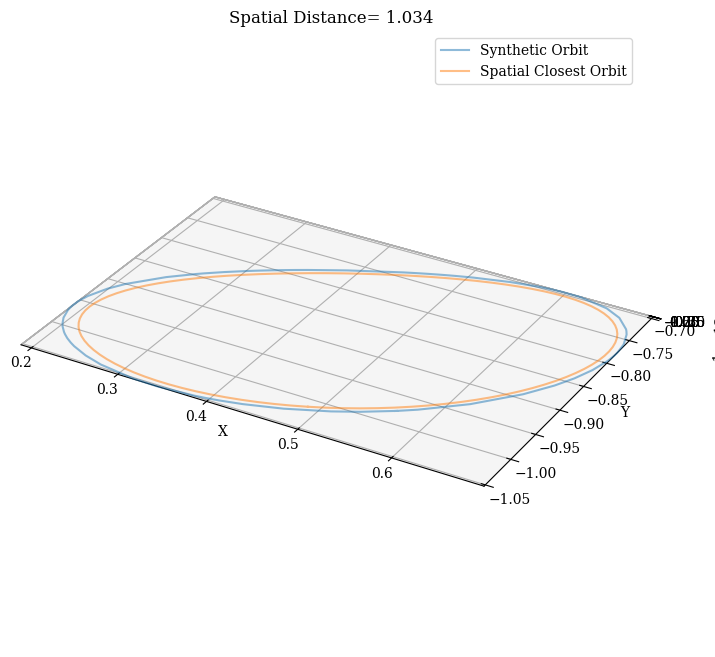

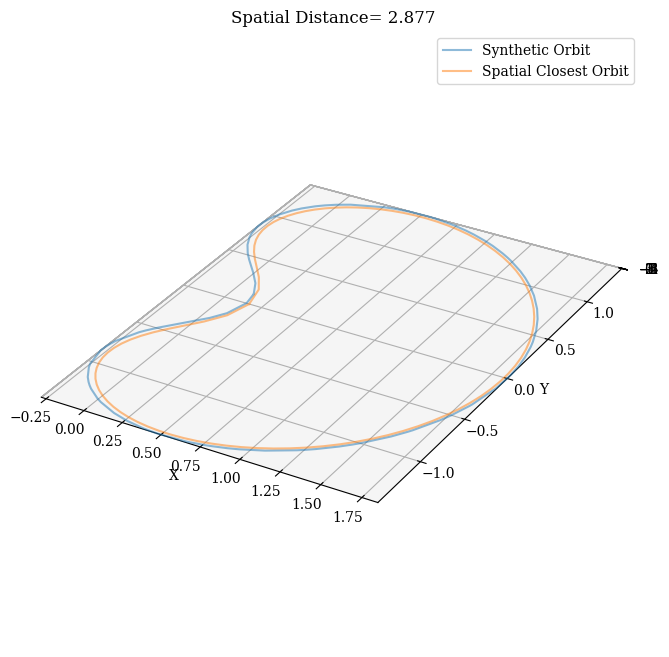

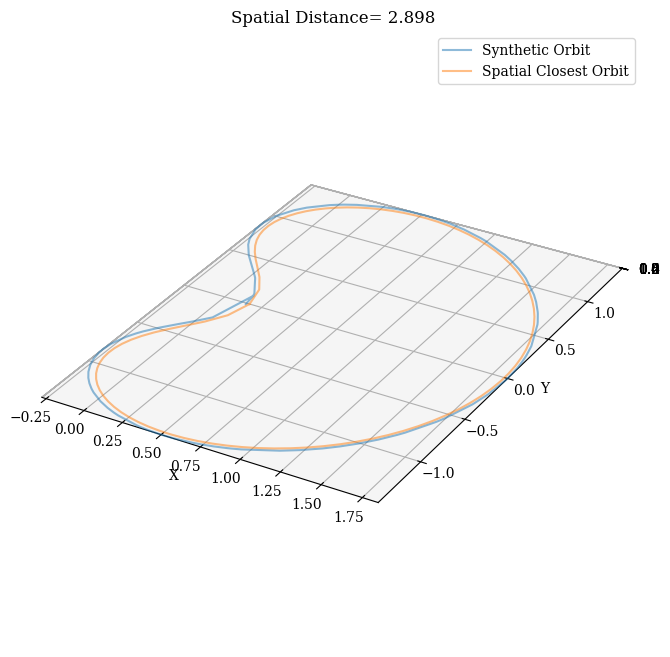

In [92]:
for i in range(len(refinement_and_closers)):
    title = f"Spatial Distance= {distance_discovery_df['nearest_orbit_distance'].iloc[i].round(3)}"
    visualize_static_orbits(refinement_and_closer[i,:,1:,:], title=title,
                            orbit_names=['Synthetic Orbit', 'Spatial Closest Orbit'], equal_aspect=True)

# Both Discovery

In [93]:
ml_discovery_df.shape

(24, 45)

In [94]:
ml_discovery_df.head()

,id,old_period,period,iterations_convergence,error,initial_pos_x0,initial_pos_y0,initial_pos_z0,initial_vel_x0,initial_vel_y0,initial_vel_z0,final_pos_x0,final_pos_y0,final_pos_z0,final_vel_x0,final_vel_y0,final_vel_z0,disorder_metric,correct_order,inversions,kendall_tau_distance,propagated_position_error,propagated_velocity_error,propagated_energy_error,latent_distance_to_generation,calculated_jacobi,period_distance_with_generation,feature_closest_orbit,feature_distance_from_closest_orbit,nearest_orbit,nearest_orbit_distance,distance_from_generation,centroid_distance,feature_centroid_distance,closest_family_centroid,closest_family_centroid_distance,closest_family_feature_centroid,closest_family_feature_centroid_distance,initial_conditions_distance,closest_family_full_centroid,closest_family_full_centroid_distance,family_of_feature_closest_orbit,family_of_closest_orbit,family_classification,svm_discovered
3,7,4.687366,4.729179,11,1.505815e-12,1.097317,0.007104,-0.004319,-0.041922,-0.228566,-0.155920,1.225314,-0.240151,3.673249e-15,-0.252196,-0.510227,8.882345e-15,486.0,66.0,323.0,0.130505,1.739751e-12,3.280340e-12,5.691519e-14,0.164957,2.886419,0.041812,28511,0.003577,13907,4.619803,4.623523,0.586623,2.569823,2,0.210171,11,0.383418,0.474759,32,0.057855,26.0,12.0,24.0,True
13,25,6.267957,6.302419,7,9.250269e-14,0.649462,-0.208975,0.530647,-0.513931,-1.248690,-0.129627,0.790788,-0.079026,6.030065e-01,-0.156995,-1.787661,-2.697504e-02,42.0,86.0,22.0,0.008889,8.133294e-13,3.401231e-12,1.153735e-14,0.180229,-0.578043,0.034462,23907,0.001589,23910,2.629421,2.952479,1.723198,3.129967,5,0.564602,20,0.808687,0.685949,20,0.561912,21.0,21.0,29.0,True
17,37,6.239189,6.290220,11,3.334062e-10,0.260018,0.098357,0.015612,0.178856,4.377156,0.054999,0.120657,0.006759,-5.916706e-10,-0.091344,3.591929,-5.746297e-09,54.0,85.0,30.0,0.012121,1.984281e-12,1.152517e-11,3.911712e-10,0.065939,2.001509,0.051031,34126,0.000160,34285,3.288539,3.734941,1.320080,1.043808,7,0.021554,29,0.045338,0.848922,29,0.022563,32.0,32.0,5.0,True
19,42,5.897058,6.250497,8,1.556177e-12,-0.387796,-0.177516,0.415901,-0.148452,0.333273,-0.034302,-0.790730,0.007751,6.170293e-01,0.015614,-0.213484,2.258046e-02,74.0,79.0,41.0,0.016566,9.883372e-13,1.440183e-12,1.159925e-13,0.171978,2.592593,0.353439,24623,0.000589,24624,1.010222,2.718212,1.860177,1.020397,5,0.676565,19,0.047427,0.752482,26,0.551578,21.0,21.0,18.0,True
21,44,4.465792,3.481283,10,1.619572e-12,1.104547,0.021965,0.002849,0.033624,-0.177650,-0.138198,1.193513,0.025744,-6.507856e-16,0.039781,-0.509153,1.350955e-15,452.0,66.0,315.0,0.127273,8.151772e-13,2.023008e-12,3.685492e-14,0.063433,2.931873,0.984509,5447,0.002069,13907,2.884701,3.419481,0.645886,3.808788,2,0.262831,6,0.546015,0.370092,32,0.069004,5.0,12.0,15.0,True


In [95]:
distance_discovery_df.shape

(30, 45)

In [96]:
distance_discovery_df.head()

,id,old_period,period,iterations_convergence,error,initial_pos_x0,initial_pos_y0,initial_pos_z0,initial_vel_x0,initial_vel_y0,initial_vel_z0,final_pos_x0,final_pos_y0,final_pos_z0,final_vel_x0,final_vel_y0,final_vel_z0,disorder_metric,correct_order,inversions,kendall_tau_distance,propagated_position_error,propagated_velocity_error,propagated_energy_error,latent_distance_to_generation,calculated_jacobi,period_distance_with_generation,feature_closest_orbit,feature_distance_from_closest_orbit,nearest_orbit,nearest_orbit_distance,distance_from_generation,centroid_distance,feature_centroid_distance,closest_family_centroid,closest_family_centroid_distance,closest_family_feature_centroid,closest_family_feature_centroid_distance,initial_conditions_distance,closest_family_full_centroid,closest_family_full_centroid_distance,family_of_feature_closest_orbit,family_of_closest_orbit,family_classification,svm_discovered
1,1,5.762555,6.747913,13,1.172315e-12,1.146281,0.012663,0.119440,0.007081,-0.226648,0.241234,1.016803,0.004804,2.605369e-01,-0.032308,-0.023131,1.086547e-01,236.0,71.0,158.0,0.063838,2.061160e-12,5.886800e-12,8.540419e-14,0.022202,2.986561,0.985357,1496,0.011063,2777,3.292461,3.143534,0.395551,0.771247,0,0.178532,35,0.404108,0.311901,2,0.178617,2.0,3.0,3.0,False
3,7,4.687366,4.729179,11,1.505815e-12,1.097317,0.007104,-0.004319,-0.041922,-0.228566,-0.155920,1.225314,-0.240151,3.673249e-15,-0.252196,-0.510227,8.882345e-15,486.0,66.0,323.0,0.130505,1.739751e-12,3.280340e-12,5.691519e-14,0.164957,2.886419,0.041812,28511,0.003577,13907,4.619803,4.623523,0.586623,2.569823,2,0.210171,11,0.383418,0.474759,32,0.057855,26.0,12.0,24.0,True
9,16,6.528803,6.570699,10,3.835939e-14,0.427496,-0.936014,-0.004755,-0.315845,0.101363,-0.027506,0.497595,-1.013998,-1.657932e-14,-0.231612,-0.106625,-1.248178e-14,266.0,75.0,188.0,0.075960,2.894810e-12,4.941286e-12,3.018909e-15,0.082064,2.985193,0.041896,26691,0.000118,29885,0.928135,1.814572,0.927912,0.896527,2,0.639502,35,0.237827,0.249257,39,0.118382,24.0,28.0,28.0,False
11,21,6.023031,6.371288,13,1.399211e-10,0.179075,-1.428248,0.013620,-0.977275,-0.185913,-0.006427,0.427502,-1.528860,8.835852e-12,-1.012535,-0.485334,5.527849e-12,226.0,72.0,143.0,0.057778,2.659393e-12,5.263543e-12,3.917585e-12,0.152612,2.528259,0.348258,26180,0.000533,29396,4.343660,3.749823,1.767455,0.890735,6,0.253451,25,0.034936,0.403686,37,0.245939,24.0,28.0,28.0,False
14,29,6.610111,6.561818,9,2.261375e-13,0.359305,-0.840463,0.004484,-0.332252,0.031686,0.005566,0.530488,-1.047181,3.333963e-14,-0.294212,-0.161974,7.351506e-15,106.0,80.0,66.0,0.026667,3.166916e-12,5.623738e-12,5.539901e-15,0.107038,2.973616,0.048293,26656,0.000131,29845,0.904452,1.983891,0.855927,0.895902,2,0.575371,35,0.224734,0.333224,39,0.048375,24.0,28.0,28.0,False


In [97]:
both_discovery_df = distance_discovery_df[
    (distance_discovery_df['svm_discovered'] == True) & 
    ((distance_discovery_df['family_classification'] == distance_discovery_df['family_of_feature_closest_orbit']) | 
     (distance_discovery_df['family_classification'] == distance_discovery_df['family_of_closest_orbit']))
]
both_discovery_df.shape

(5, 45)

In [98]:
both_discovery_df.head()

,id,old_period,period,iterations_convergence,error,initial_pos_x0,initial_pos_y0,initial_pos_z0,initial_vel_x0,initial_vel_y0,initial_vel_z0,final_pos_x0,final_pos_y0,final_pos_z0,final_vel_x0,final_vel_y0,final_vel_z0,disorder_metric,correct_order,inversions,kendall_tau_distance,propagated_position_error,propagated_velocity_error,propagated_energy_error,latent_distance_to_generation,calculated_jacobi,period_distance_with_generation,feature_closest_orbit,feature_distance_from_closest_orbit,nearest_orbit,nearest_orbit_distance,distance_from_generation,centroid_distance,feature_centroid_distance,closest_family_centroid,closest_family_centroid_distance,closest_family_feature_centroid,closest_family_feature_centroid_distance,initial_conditions_distance,closest_family_full_centroid,closest_family_full_centroid_distance,family_of_feature_closest_orbit,family_of_closest_orbit,family_classification,svm_discovered
55,123,4.444896,3.359542,13,2.193785e-13,1.203362,0.020082,-0.003033,0.062078,-0.106836,-0.197804,1.156220,-0.078120,6.310132e-02,-0.065988,-0.129117,-7.429845e-02,308.0,69.0,207.0,0.083636,1.019802e-12,1.997774e-12,2.489591e-15,0.293825,3.137137,1.085354,16668,0.000089,15293,1.496225,3.518579,0.510401,3.962190,2,0.231221,27,0.657360,0.219979,32,0.115568,14.0,13.0,13.0,True
65,152,5.867510,6.687959,11,2.321627e-13,1.204813,0.032133,0.157464,-0.018818,-0.339434,0.127372,1.089239,-0.005728,1.071983e-01,-0.122209,-0.267925,2.495501e-01,38.0,87.0,22.0,0.008889,1.591243e-12,4.291071e-12,2.359504e-15,0.032194,2.999419,0.820449,421,0.000120,2985,2.570677,2.338190,0.345153,0.821075,0,0.013418,35,0.351067,0.219199,2,0.013502,1.0,3.0,1.0,True
79,192,6.185884,6.905154,12,5.940210e-13,1.029134,0.025126,0.142187,0.015899,-0.185516,0.146285,1.189901,0.043858,-1.540889e-17,0.068220,-0.502413,3.433565e-18,104.0,79.0,59.0,0.023838,1.864840e-12,4.285336e-12,1.155978e-14,0.220865,2.932766,0.719270,17412,0.001764,6450,3.754301,3.833756,0.377562,0.633105,0,0.207213,35,0.549027,0.413490,13,0.112513,15.0,6.0,15.0,True
120,262,6.191903,6.284070,12,7.031769e-10,0.134241,0.148865,-0.004711,-1.080513,1.709080,-0.006623,0.128675,0.113647,1.271744e-13,-0.976604,2.818471,2.231203e-12,28.0,87.0,16.0,0.006465,2.242737e-12,1.853049e-11,7.043480e-11,0.108212,2.089710,0.092167,5016,0.000102,34484,2.877084,3.292299,1.153385,1.018921,7,0.155485,29,0.043117,1.114847,29,0.153296,5.0,32.0,5.0,True
122,272,6.381490,6.283706,10,1.064433e-10,0.109512,0.175708,0.003569,-1.348761,1.394828,0.029347,0.137057,0.092182,4.955681e-13,-0.818367,2.927218,2.472414e-11,30.0,89.0,17.0,0.006869,1.940769e-12,6.705729e-12,1.255801e-10,0.104878,2.094193,0.097784,5018,0.000036,34496,2.897514,4.052916,1.254153,1.017894,7,0.054820,29,0.047611,1.624237,29,0.052627,5.0,32.0,5.0,True


In [103]:
# Stack discovered orbits with their feature closest and nearest orbits
refinement_indexes = both_discovery_df.index.to_list()
feature_closest_orbit_indexes = both_discovery_df['feature_closest_orbit'].to_list()
nearest_orbit_indexes = both_discovery_df['nearest_orbit'].to_list()

discovery_refinement = reordered_refined_orbits[refinement_indexes]
feature_closest_orbits = full_data[feature_closest_orbit_indexes]
nearest_orbits = full_data[nearest_orbit_indexes]

both_refinement_and_closers = np.stack(
    (discovery_refinement, feature_closest_orbits, nearest_orbits),
    axis=1
)
both_refinement_and_closers.shape

(5, 3, 7, 100)

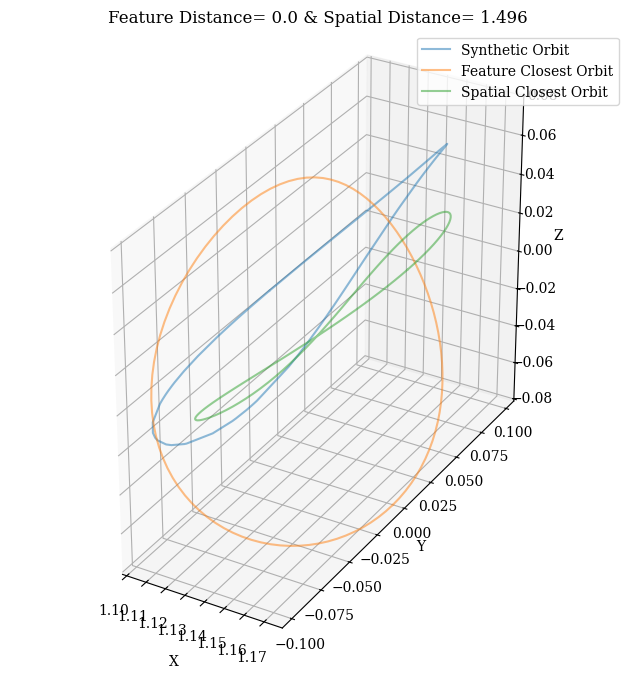

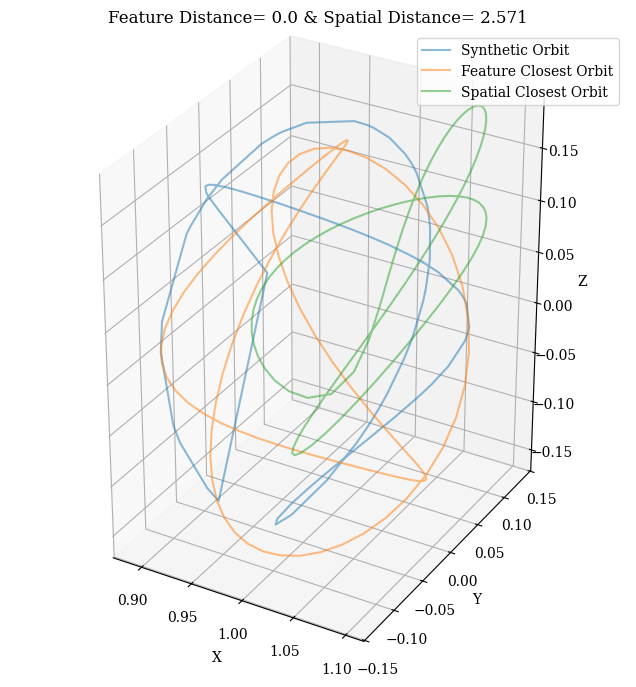

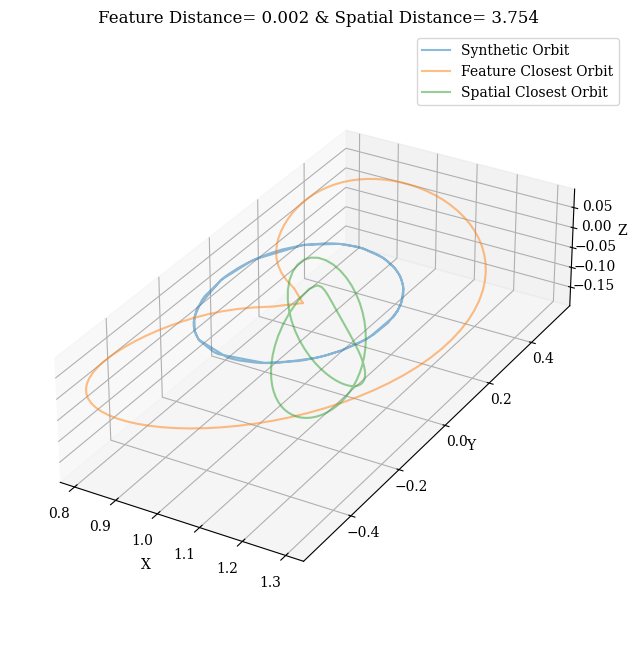

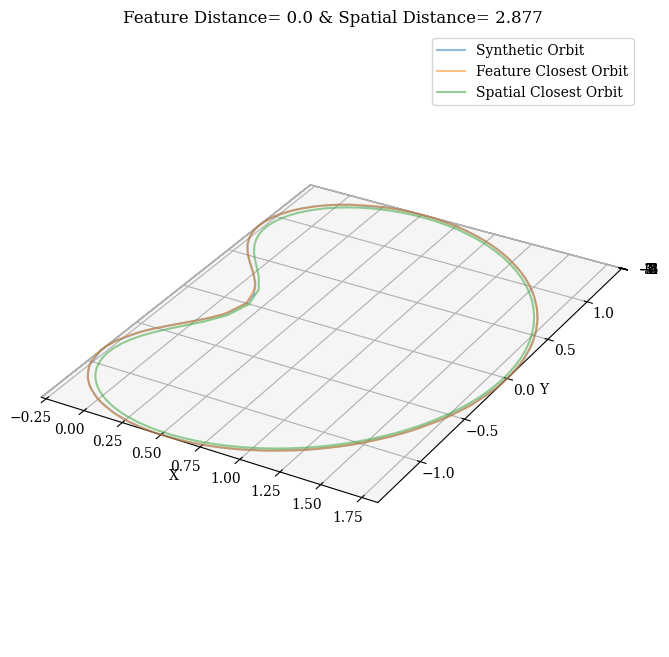

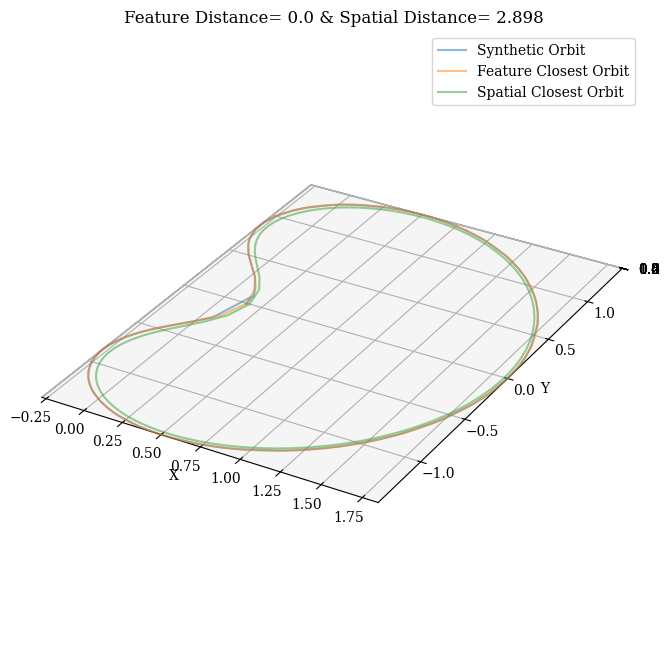

In [100]:
for i in range(len(both_refinement_and_closers)):
    title = f"Feature Distance= {both_discovery_df['feature_distance_from_closest_orbit'].iloc[i].round(3)} & Spatial Distance= {both_discovery_df['nearest_orbit_distance'].iloc[i].round(3)}"
    visualize_static_orbits(both_refinement_and_closers[i,:,1:,:], title=title,
                            orbit_names=['Synthetic Orbit', 'Feature Closest Orbit', 'Spatial Closest Orbit'], equal_aspect=True)

In [101]:
refinement_and_closer = np.stack(
    (discovery_refinement, nearest_orbits),
    axis=1
)
refinement_and_closer.shape

(5, 2, 7, 100)

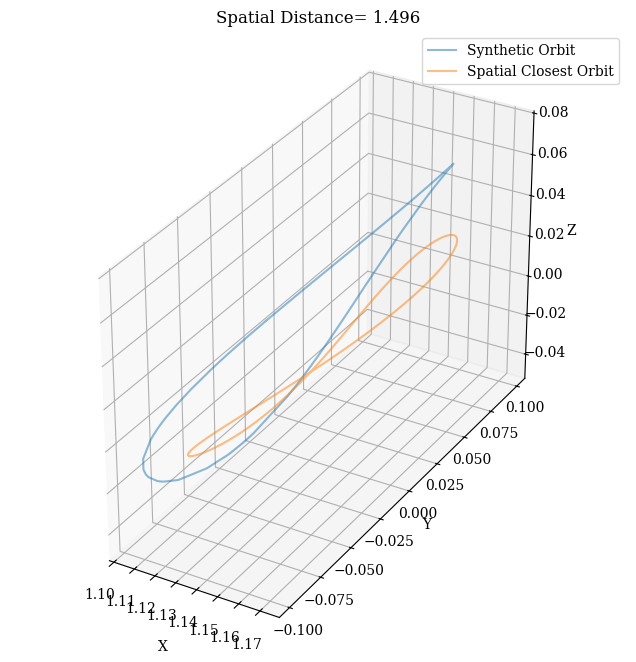

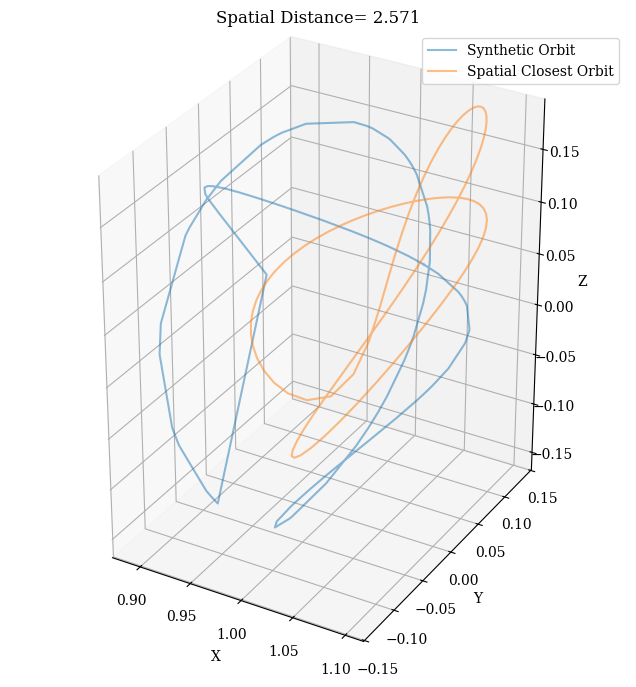

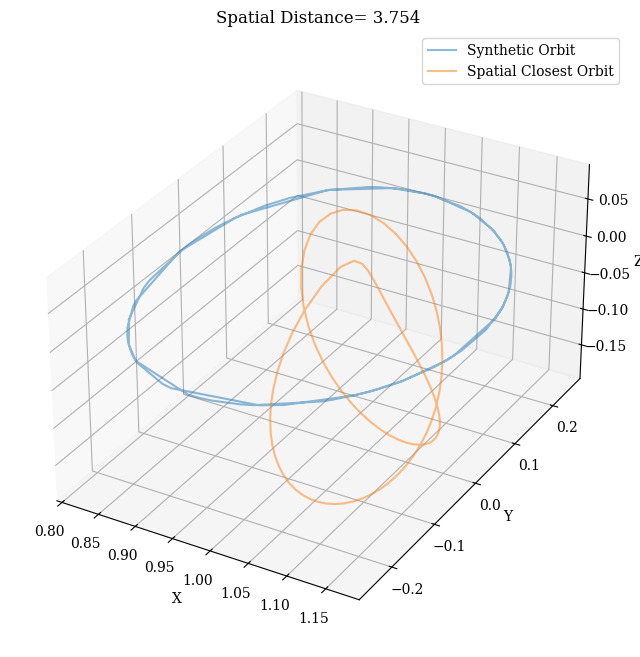

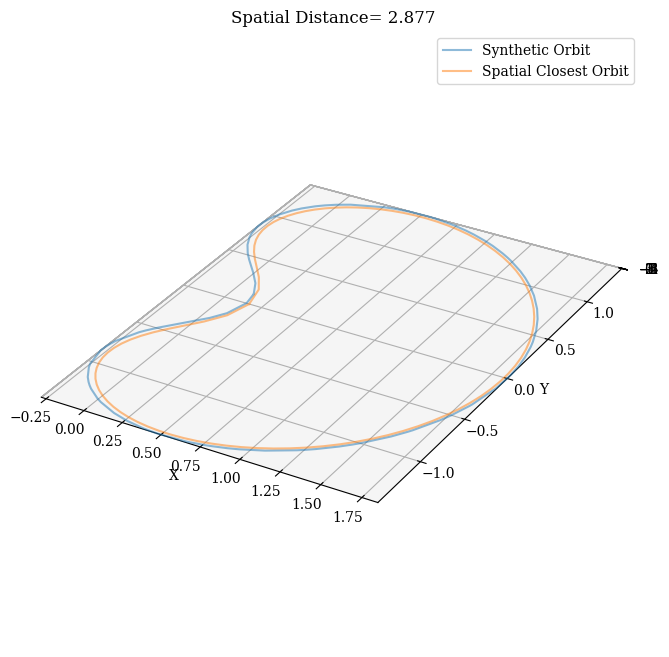

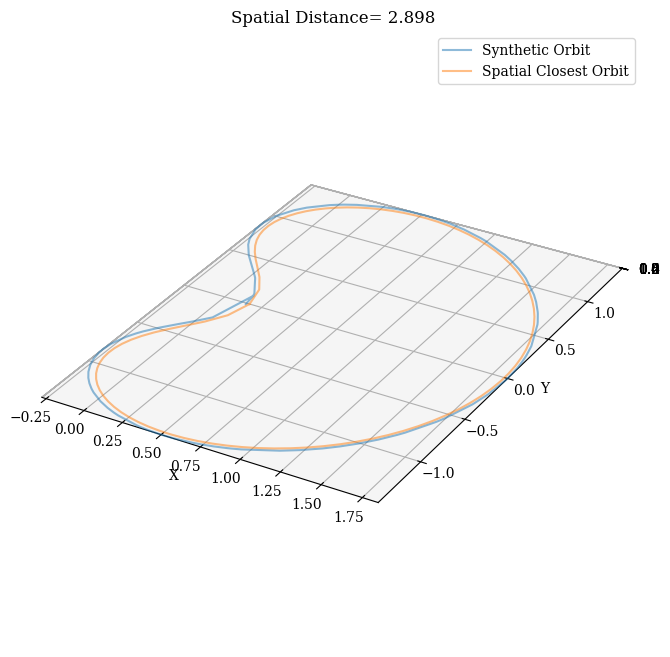

In [102]:
for i in range(len(refinement_and_closer)):
    title = f"Spatial Distance= {both_discovery_df['nearest_orbit_distance'].iloc[i].round(3)}"
    visualize_static_orbits(refinement_and_closer[i,:,1:,:], title=title,
                            orbit_names=['Synthetic Orbit', 'Spatial Closest Orbit'], equal_aspect=True)